# Sectoral equity factors

This notebook offers the necessary code to replicate the research findings discussed in the Macrosynergy research post "Sectoral equity factora". Its primary objective is to inspire readers to explore and conduct additional investigations whilst also providing a foundation for testing their own unique ideas.

On the back of our initial exploration of the [relationship between macroeconomic trends and sectoral equity indices](https://macrosynergy.com/research/macro-trends-and-equity-allocation-a-brief-introduction/), we explore a comprehensive set of ideas for capital allocation across sectors within the same country.

In order to prevent potential CPU and RAM issues the user might have faced while running the analysis, we have decided to split the content in two blocks. You can find the initial set of data manipulation and visualisation in the notebook "Sectoral equity indicators". This second notebook covers the following:

- Get Packages and JPMaQS Data: This section is responsible for installing and importing the necessary Python packages used throughout the analysis.

- Value checks: This is the most critical section, where the notebook calculates and implements the trading strategies based on the hypotheses tested in the post. This section involves backtesting simple trading strategies. 

It is important to note that while the notebook covers a selection of indicators and strategies used for the post’s main findings, users can explore countless other possible indicators and approaches. Users can modify the code to test different hypotheses and strategies based on their research and ideas. Best of luck with your research!

## Get packages and JPMaQS data

This notebook primarily relies on the standard packages available in the Python data science stack. However, there is an additional package `macrosynergy` that is required for two purposes:

- Downloading JPMaQS data: The `macrosynergy` package facilitates the retrieval of JPMaQS data, which is used in the notebook.

- For the analysis of quantamental data and value propositions: The `macrosynergy` package provides functionality for performing quick analyses of quantamental data and exploring value propositions.

For detailed information and a comprehensive understanding of the `macrosynergy` package and its functionalities, please refer to the [“Introduction to Macrosynergy package”](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) notebook on the Macrosynergy Quantamental Academy or visit the following link on [Kaggle](https://www.kaggle.com/code/macrosynergy/introduction-to-macrosynergy-package).

In [1]:
import numpy as np
import pandas as pd
from pandas import Timestamp
import matplotlib.pyplot as plt
import seaborn as sns

import copy
import warnings
import os
from IPython.display import HTML

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import (make_scorer, mean_squared_error)

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.pnl as msn
import macrosynergy.signal as mss
import macrosynergy.learning as msl
import macrosynergy.visuals as msv
from macrosynergy.download import JPMaQSDownload

warnings.simplefilter("ignore")

This notebook downloads selected indicators for the following cross-sections: AUD (Australian dollar), CAD (Canadian dollar), CHF (Swiss franc), EUR (euro), GBP (British pound),  HKD (Hong Kong dollar),  ILS (Israeli shekel), JPY (Japanese yen), NOK (Norwegian krone), NZD (New Zealand dollar), SEK (Swedish krona), SGD (Singapore dollar), USD (U.S. dollar) as well as five main European currencies  ['DEM', 'ESP', 'FRF', 'ITL', 'NLG'], replaced by EUR.

In [2]:
# Commodity cross sections
comm_cids = [
    "ALM", "CPR", "LED", "NIC", "TIN", "ZNC",  # non-precious metals
    "BRT", "WTI", "NGS", "GSO", "HOL",  # energy
    "CLB"  # lumber
]

# Equity sectoral cross-section lists: excluding HKD
cids_dmeq = ['AUD', 'CAD', 'CHF', 'EUR', 'GBP', 'ILS', 'JPY', 'NOK', 'NZD', 'SEK', 'SGD', 'USD']
cids_eueq = ['DEM', 'ESP', 'FRF', 'ITL', 'NLG']
cids_extra = []

cids = sorted(cids_dmeq + cids_extra)
cids_eqx = list(set(cids_dmeq) - {'HKD'})

In [3]:
sector_labels = {
    "ALL": "All sectors", 
    "COD": "Cons. discretionary",
    "COS": "Cons. staples",
    "CSR": "Communication services",
    "ENR": "Energy",
    "FIN": "Financials",
    "HLC": "Healthcare",
    "IND": "Industrials",
    "ITE": "Information tech",
    "MAT": "Materials",
    "REL": "Real estate",
    "UTL": "Utilities",
}
secx = list(sector_labels.keys())

JPMaQS indicators are conveniently grouped into 6 main categories: Economic Trends, Macroeconomic balance sheets, Financial conditions, Shocks and risk measures, Stylized trading factors, and Generic returns. Each indicator has a separate page with notes, description, availability, statistical measures, and timelines for main currencies. The description of each JPMaQS category is available either under [JPMorgan Markets](https://markets.jpmorgan.com/#jpmaqs) (password protected) or the [Macro Quantamental Academy](https://academy.macrosynergy.com/quantamental-indicators/). 


In particular, some of the indicators used in this notebook can be found in [Consumer price inflation trends](https://macrosynergy.com/academy/notebooks/consumer-price-inflation-trends), [Producer price inflation](https://macrosynergy.com/academy/notebooks/producer-price-inflation), [Manufacturing confidence](https://macrosynergy.com/academy/notebooks/manufacturing-confidence-scores), [Services confidence](https://macrosynergy.com/academy/notebooks/services-confidence-scores), [Private consumption](https://macrosynergy.com/academy/notebooks/private-consumption), [Foreign trade trends](https://macrosynergy.com/academy/notebooks/foreign-trade-trends), [Labor market dynamics](https://macrosynergy.com/academy/notebooks/labor-market-dynamics), [Technical GDP Growth](https://macrosynergy.com/academy/notebooks/technical-gdp-growth-estimates), and [Industrial production trends](https://macrosynergy.com/academy/notebooks/industrial-production-trends).

In [4]:
# Economic indicators
manuf = [
    "MBCSCORE_SA",
    "MBCSCORE_SA_D3M3ML3",
    "MBCSCORE_SA_WG",
    "MBCSCORE_SA_D3M3ML3_WG",
    "XIP_SA_P1M1ML12_3MMA",
    "XIP_SA_P1M1ML12_3MMA_WG",
]
servi = [
    "SBCSCORE_SA",
    "SBCSCORE_SA_D3M3ML3",
    "SBCSCORE_SA_WG",
    "SBCSCORE_SA_D3M3ML3_WG",
]
constr = [
    "CBCSCORE_SA",
    "CBCSCORE_SA_D3M3ML3",
    "CBCSCORE_SA_WG",
    "CBCSCORE_SA_D3M3ML3_WG",
    "XCSTR_SA_P1M1ML12_3MMA",
    "XCSTR_SA_P1M1ML12_3MMA_WG", 
]
consu = [
    "CCSCORE_SA",
    "CCSCORE_SA_D3M3ML3",
    "CCSCORE_SA_WG",
    "CCSCORE_SA_D3M3ML3_WG",
    "XPCREDITBN_SJA_P1M1ML12",
    "XPCREDITBN_SJA_P1M1ML12_WG",    
    "XNRSALES_SA_P1M1ML12_3MMA",
    "XRRSALES_SA_P1M1ML12_3MMA",
    "XNRSALES_SA_P1M1ML12_3MMA_WG",
    "XRRSALES_SA_P1M1ML12_3MMA_WG", 
    "XRPCONS_SA_P1M1ML12_3MMA",
    "XRPCONS_SA_P1M1ML12_3MMA_WG",
]
cpi = [
    "XCPIC_SA_P1M1ML12",
    "XCPIH_SA_P1M1ML12",
    "XCPIE_SA_P1M1ML12",
    "XCPIF_SA_P1M1ML12",
    "XCPIE_SA_P1M1ML12_WG",
    "XCPIF_SA_P1M1ML12_WG",
]
ppi = [
    "XPPIH_NSA_P1M1ML12",
]

labour = [
    "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_SA_3MMAv5YMA",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12_WG",
    "UNEMPLRATE_SA_3MMAv5YMA_WG",
    "XEMPL_NSA_P1M1ML12_3MMA",
    "XEMPL_NSA_P1M1ML12_3MMA_WG",
    "XRWAGES_NSA_P1M1ML12",
]
exps = [
    # Trade and competitiveness
    "XEXPORTS_SA_P1M1ML12_3MMA",
    
    "CXPI_NSA_P1M12ML1",
    "CMPI_NSA_P1M12ML1",
    "CTOT_NSA_P1M12ML1",
    "REEROADJ_NSA_P1M12ML1",
]

ecos = manuf + servi + consu + cpi + ppi + labour + exps + constr

# Complementary economic indicators
ecox = [
    "XRGDPTECH_SA_P1M1ML12_3MMA",
    "XRGDPTECH_SA_P1M1ML12_3MMA_WG",
    
    # Financial conditions
    "INTLIQGDP_NSA_D1M1ML1",
    "INTLIQGDP_NSA_D1M1ML6",
    "HHINTNETGDP_SA_D1M1ML12",    
    "HHINTNETGDP_SA_D1M1ML12_WG",
    "CORPINTNETGDP_SA_D1Q1QL4",
    "CORPINTNETGDP_SA_D1Q1QL4_WG",
    "XGGDGDPRATIOX10_NSA",

    # Financial markets
    "RIR_NSA",
    "RYLDIRS02Y_NSA",
    "RYLDIRS05Y_NSA",
    "RSLOPEMIDDLE_NSA",
    "BMLCOCRY_SAVT10_21DMA",
    "BMLXINVCSCORE_SA", 
    "REFIXINVCSCORE_SA", 
    "BASEXINVCSCORE_SA",
    "COXR_VT10vWTI_21DMA"
]

# Market indicators
eqrets = ["EQC" + sec + ret for sec in secx for ret in ["XR_NSA", "R_NSAvALL", "R_VT10vALL"]]
fxrets = []

marks = eqrets + fxrets

# All indicators
xcats = [x+suff for x in ecos + ecox for suff in ["_ZN", "_ZN_NEG"]] + marks

# Resultant tickers
bmk_tickers = ["USD_EQXR_NSA", "USD_EQXR_VT10"]
tickers = [
    cid + "_" + xcat 
    for cid in cids 
    for xcat in xcats
] + bmk_tickers
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 1994


In [5]:
# Assumes the two notebooks are in the same folder
INPUT_PATH = os.path.join(os.getcwd(), "..\..\..\..\equity_sectoral_notebook_data.csv")

dfx = pd.read_csv(INPUT_PATH, index_col=0)
dfx["real_date"] = pd.to_datetime(dfx["real_date"]).dt.date

dfx = msm.utils.standardise_dataframe(dfx)
dfx = dfx.sort_values(["cid", "xcat", "real_date"])

In [9]:
import datetime

dfx = dfx.loc[dfx["real_date"] <= datetime.datetime(2024, 6, 30)]

### Availability

It is important to assess data availability before conducting any analysis. It allows identifying any potential gaps or limitations in the dataset, which can impact the validity and reliability of analysis and ensure that a sufficient number of observations for each selected category and cross-section is available as well as determining the appropriate time periods for analysis. 

In [10]:
ecos_xq = [x + '_ZN' for x in ecos + ecox]
msm.missing_in_df(dfx, xcats=ecos_xq, cids=cids_eqx)

No missing XCATs across DataFrame.
Missing cids for BASEXINVCSCORE_SA_ZN:                []
Missing cids for BMLCOCRY_SAVT10_21DMA_ZN:            []
Missing cids for BMLXINVCSCORE_SA_ZN:                 []
Missing cids for CBCSCORE_SA_D3M3ML3_WG_ZN:           ['AUD', 'GBP', 'NOK', 'NZD', 'SGD']
Missing cids for CBCSCORE_SA_D3M3ML3_ZN:              ['AUD', 'GBP', 'NOK', 'NZD', 'SGD']
Missing cids for CBCSCORE_SA_WG_ZN:                   ['AUD', 'GBP', 'NOK', 'NZD', 'SGD']
Missing cids for CBCSCORE_SA_ZN:                      ['AUD', 'GBP', 'NOK', 'NZD', 'SGD']
Missing cids for CCSCORE_SA_D3M3ML3_WG_ZN:            ['SGD']
Missing cids for CCSCORE_SA_D3M3ML3_ZN:               ['SGD']
Missing cids for CCSCORE_SA_WG_ZN:                    ['SGD']
Missing cids for CCSCORE_SA_ZN:                       ['SGD']
Missing cids for CMPI_NSA_P1M12ML1_ZN:                []
Missing cids for CORPINTNETGDP_SA_D1Q1QL4_WG_ZN:      ['ILS', 'SEK', 'SGD']
Missing cids for CORPINTNETGDP_SA_D1Q1QL4_ZN:        

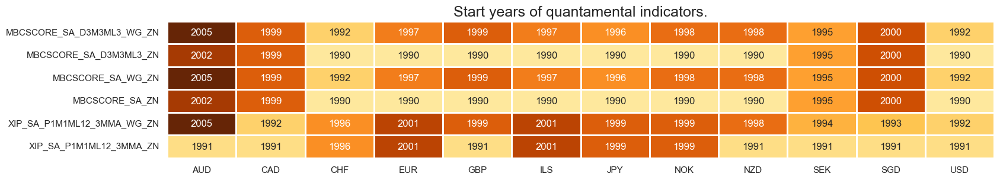

In [11]:
msm.check_availability(dfx, xcats=[x + '_ZN' for x in manuf], cids=cids_eqx, missing_recent=False)

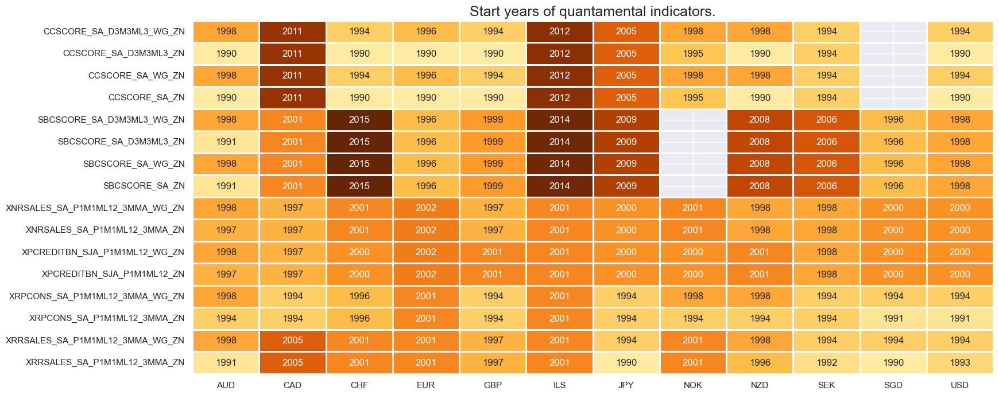

In [12]:
msm.check_availability(dfx, xcats=[x + '_ZN' for x in servi+consu], cids=cids_eqx, missing_recent=False)

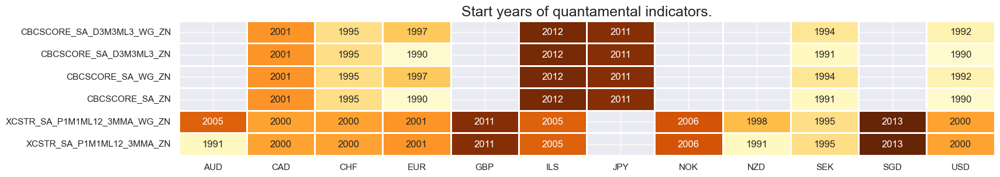

In [13]:
msm.check_availability(dfx, xcats=[x + '_ZN' for x in constr], cids=cids_eqx, missing_recent=False)

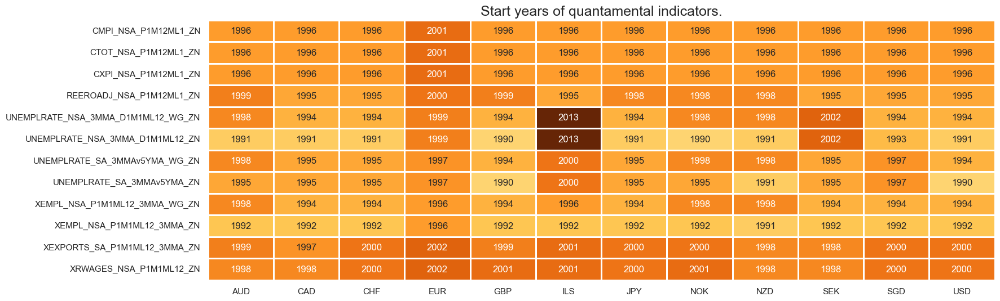

In [14]:
msm.check_availability(dfx, xcats=[x + '_ZN' for x in labour+exps], cids=cids_eqx, missing_recent=False)

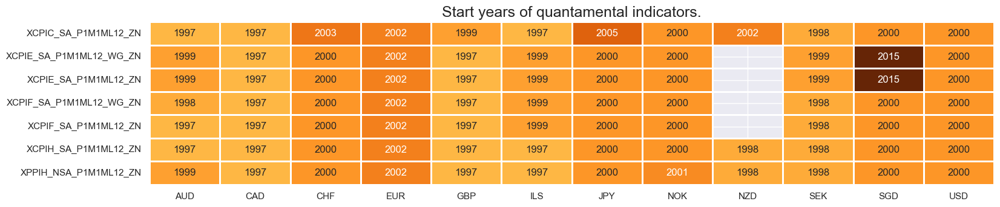

In [15]:
msm.check_availability(dfx, xcats=[x + '_ZN' for x in cpi+ppi], cids=cids_eqx, missing_recent=False)

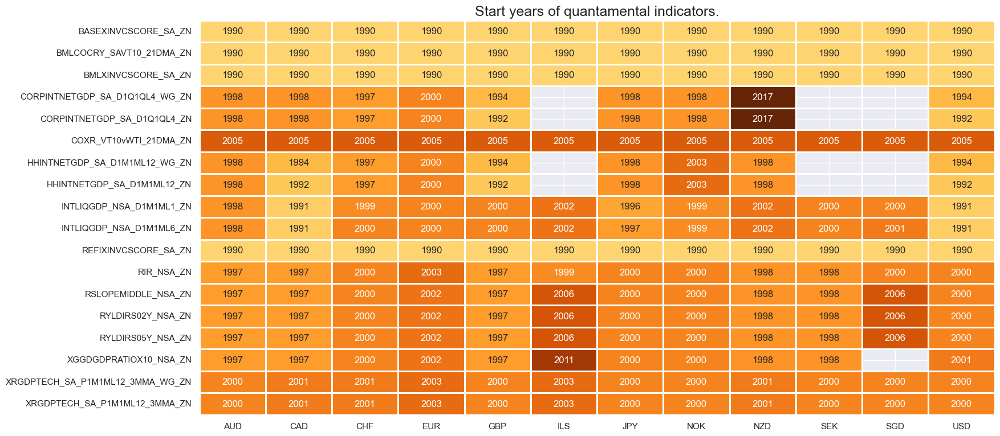

In [16]:
msm.check_availability(dfx, xcats=[x + '_ZN' for x in ecox], cids=cids_eqx, missing_recent=False)

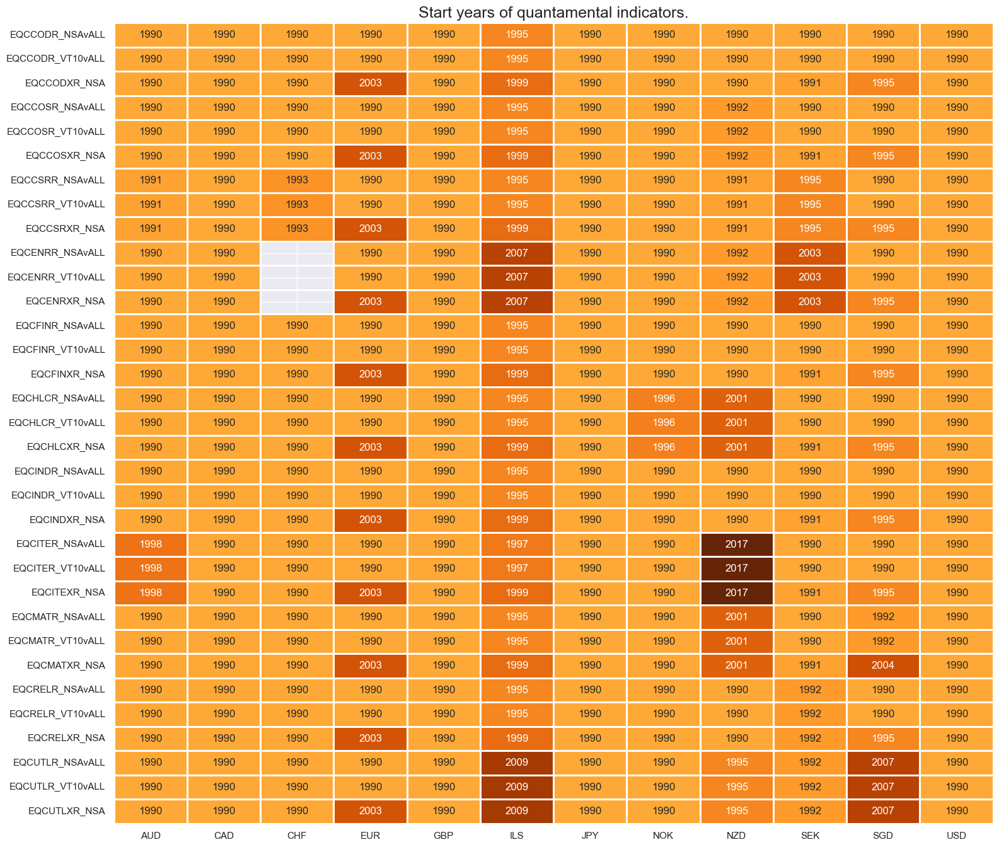

In [17]:
msm.check_availability(dfx, xcats=eqrets, cids=cids_eqx, missing_recent=False)

## Sector return charts

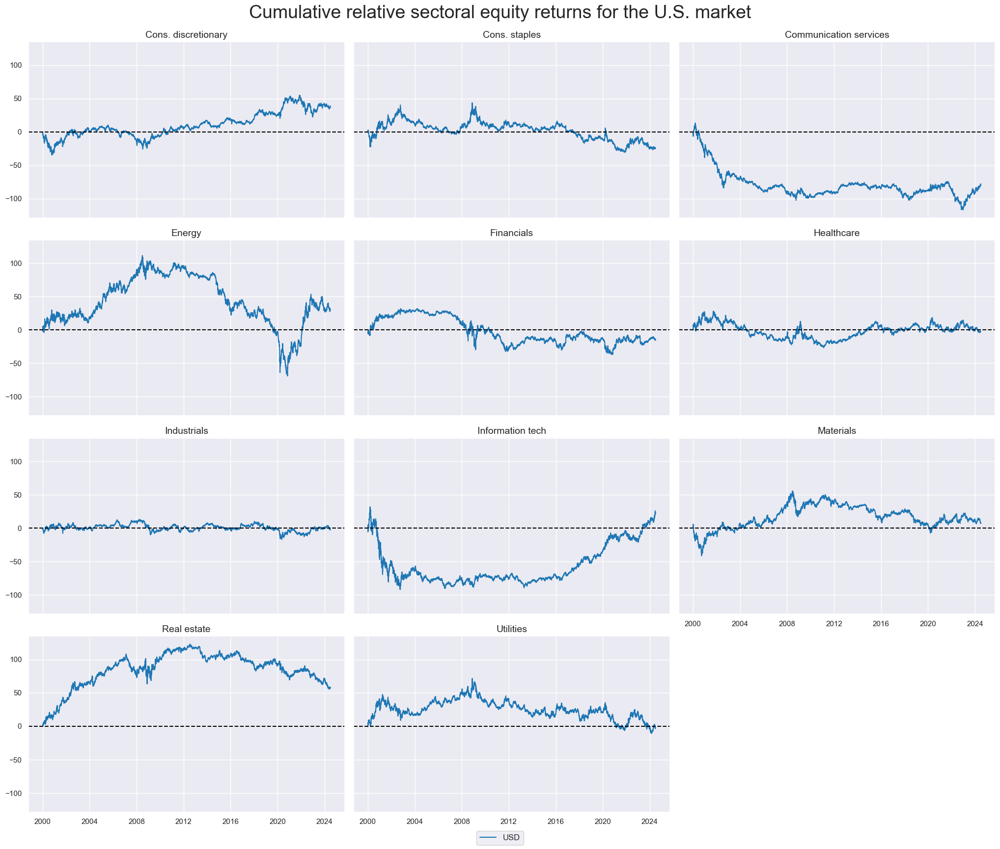

In [18]:
xcatx = [f'EQC{sec.upper()}R_NSAvALL' for sec in secx[1:]]
cidx = ["USD"]
start_date="2000-01-01"
 
msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start=start_date,
    title="Cumulative relative sectoral equity returns for the U.S. market",
    title_fontsize=27,
    cumsum=True,
    ncol=3,
    same_y=True,
    size=(12, 7),
    aspect=1.6,
    all_xticks=False,
    xcat_grid=True,
    xcat_labels=[sector_labels[key] for key in secx[1:]]
)

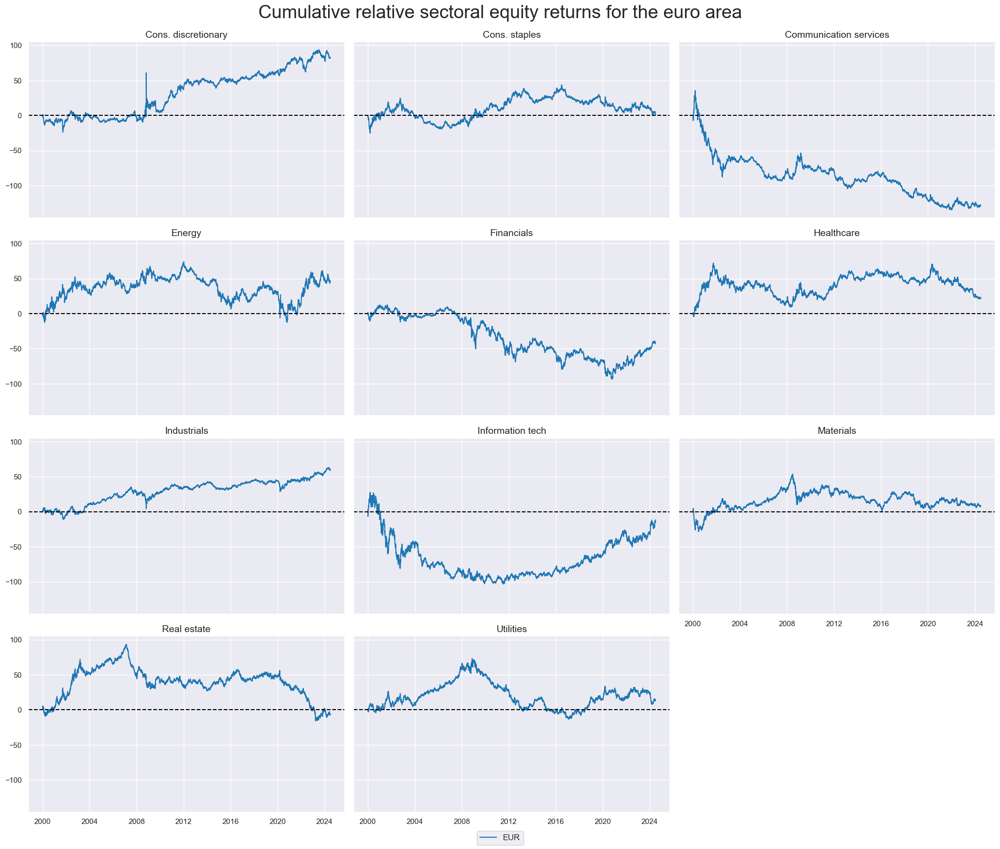

In [19]:
xcatx = [f'EQC{sec.upper()}R_NSAvALL' for sec in secx[1:]]
cidx = ["EUR"]
start_date="2000-01-01"
 
msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start=start_date,
    title="Cumulative relative sectoral equity returns for the euro area",
    title_fontsize=27,
    cumsum=True,
    ncol=3,
    same_y=True,
    size=(12, 7),
    aspect=1.6,
    all_xticks=False,
    xcat_grid=True,
    xcat_labels=[sector_labels[key] for key in secx[1:]]
)

## Value checks

### Energy sector

##### Factors and panel tests

In [20]:
sector = "ENR"
label = "Energy"

sigs = {
    "XEXPORTS_SA_P1M1ML12_3MMA_ZN": "Excess export growth, local currency, %oya, 3mma",
    "XRGDPTECH_SA_P1M1ML12_3MMA_WG_ZN": "Excess GDP growth, %oya, 3mma, weighted global",
    "XIP_SA_P1M1ML12_3MMA_WG_ZN": "Excess industrial production growth, %oya, 3mma, weighted global",
    "XCPIE_SA_P1M1ML12_WG_ZN": "Excess energy CPI growth, %oya, weighted global",
    "BASEXINVCSCORE_SA_ZN_NEG": "Energy raw materials, inventory score, negative",
    "REEROADJ_NSA_P1M12ML1_ZN_NEG": "Real openness-adj. appreciation, % vs 12m, negative",

}

enr_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

EQCENRR_NSAvALL misses: ['CHF'].
EQCENRR_NSAvALL misses: ['CHF'].
EQCENRR_NSAvALL misses: ['CHF'].
XCPIE_SA_P1M1ML12_WG_ZN misses: ['NZD'].
EQCENRR_NSAvALL misses: ['CHF'].
EQCENRR_NSAvALL misses: ['CHF'].
EQCENRR_NSAvALL misses: ['CHF'].


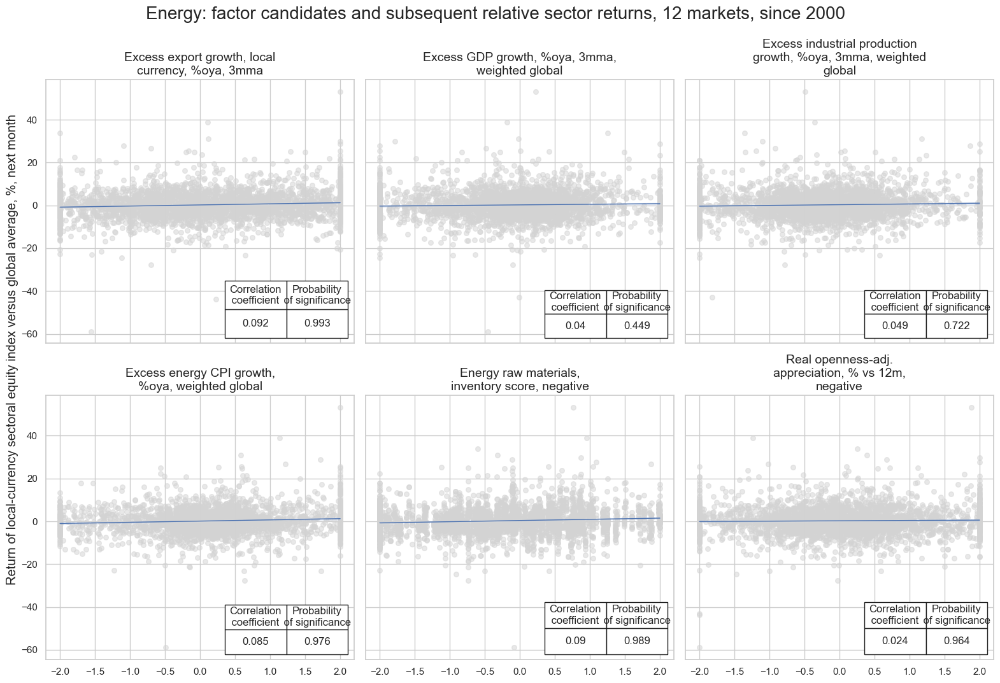

In [21]:
dix = enr_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel test

In [22]:
# Calculate conceptual parity average z-score

dix = enr_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

EQCENRR_NSAvALL misses: ['CHF'].


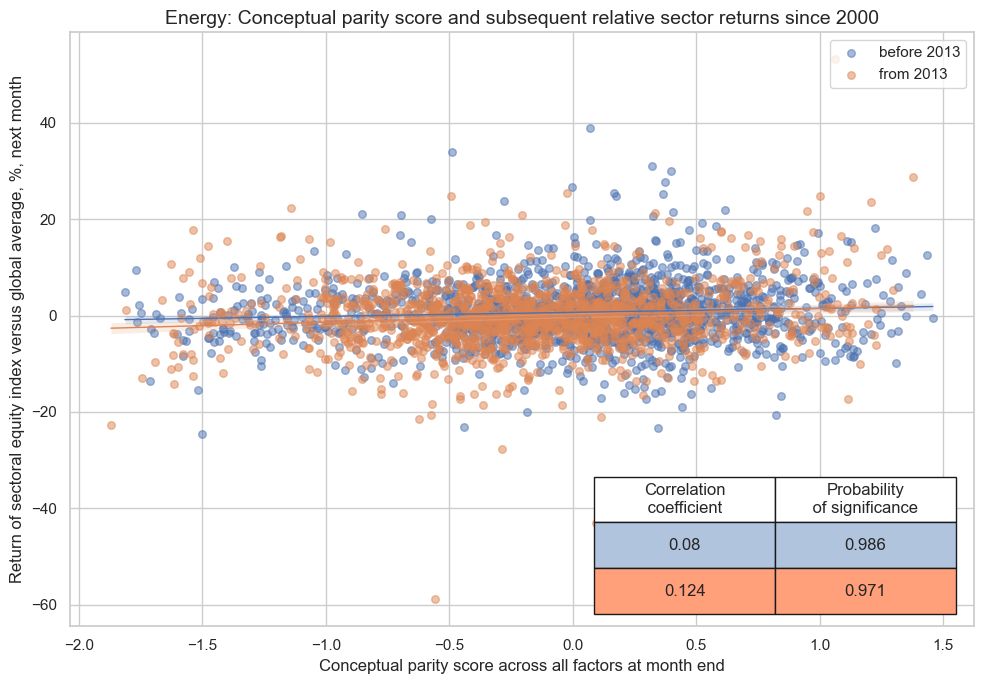

In [23]:
dix = enr_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [24]:
dix = enr_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

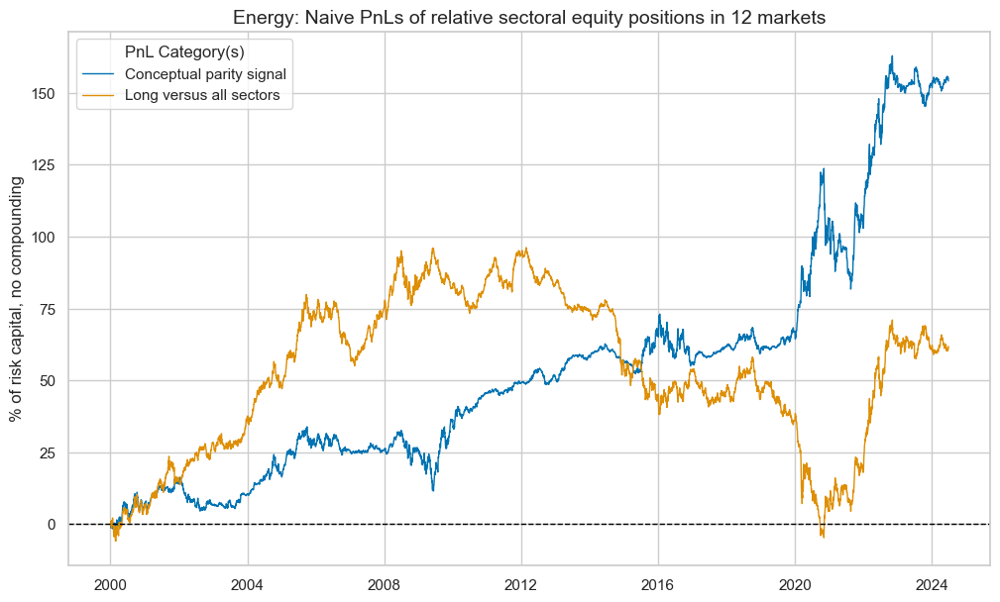

xcat,PNL_ENR_AVZ,Long only
Return %,6.29,2.53
St. Dev. %,10.00,10.00
Sharpe Ratio,0.63,0.25
Sortino Ratio,0.89,0.36
Max 21-Day Draw %,-23.83,-20.46
Max 6-Month Draw %,-29.38,-32.79
Peak to Trough Draw %,-42.00,-100.81
Top 5% Monthly PnL Share,0.89,1.95
Traded Months,294.00,294.00


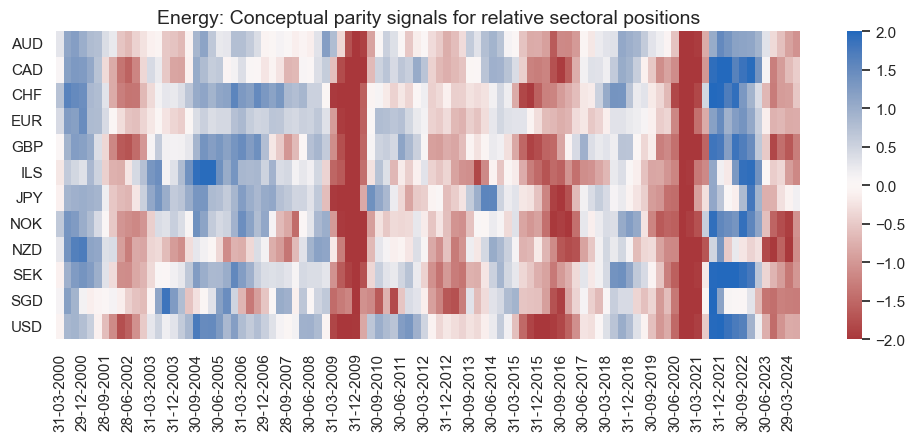

In [25]:
dix = enr_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Materials sector

##### Factors and panel tests

In [26]:
sector = "MAT"
label = "Materials"

sigs = {
    "MBCSCORE_SA_WG_ZN": "Manufacturing confidence score, sa",
    "MBCSCORE_SA_D3M3ML3_WG_ZN": "Manufacturing confidence score, sa, diff 3m/3m",
    "XPPIH_NSA_P1M1ML12_ZN": "Excess producer prices growth, %oya",
    "CTOT_NSA_P1M12ML1_ZN": "Commodity-based terms of trade, % vs prev. 12 months",
    "REEROADJ_NSA_P1M12ML1_ZN_NEG": "Open.-adj. real appreciation, % vs prev. 12 months, negative",
    "COXR_VT10vWTI_21DMA_ZN": "Refined energy returns vs. crude returns, past month",
}

mat_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

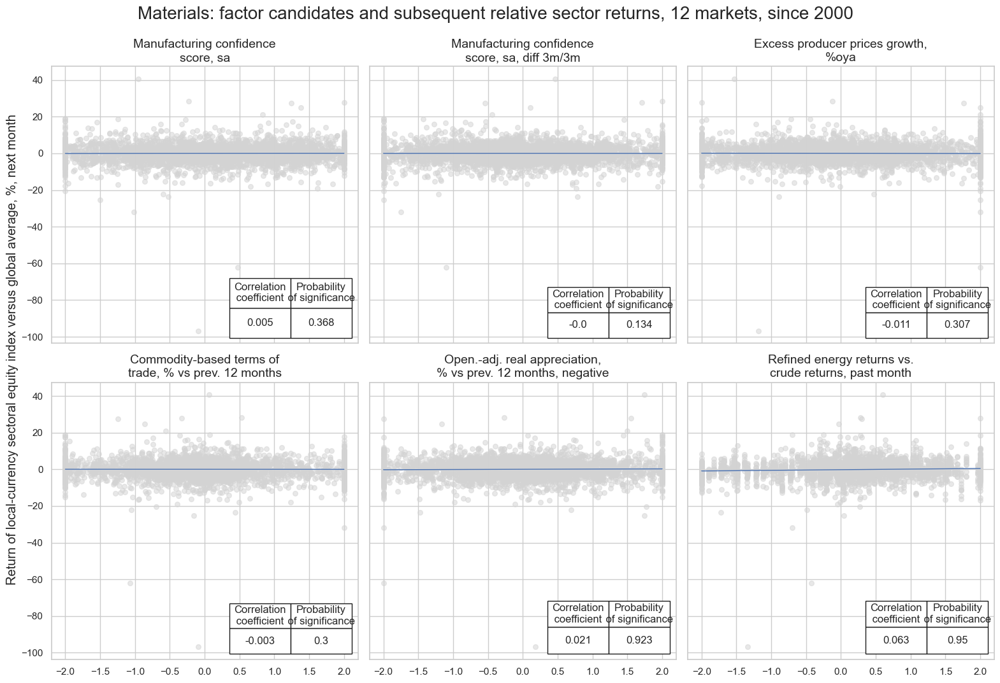

In [27]:
dix = mat_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel tests

In [28]:
# Calculate conceptual parity average z-score

dix = mat_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

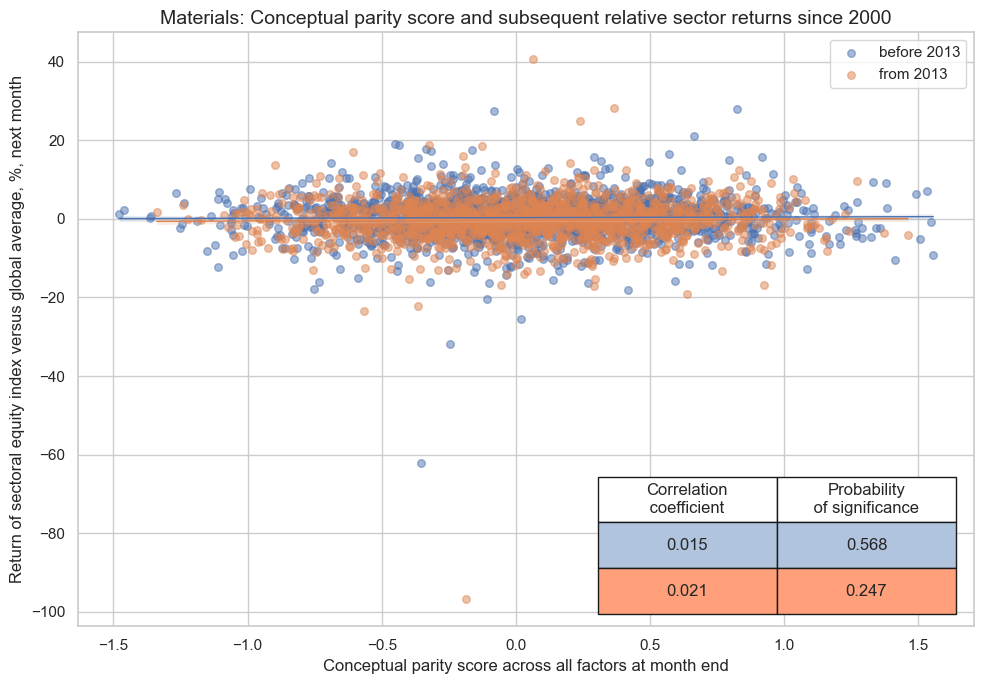

In [29]:
dix = mat_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [30]:
dix = mat_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

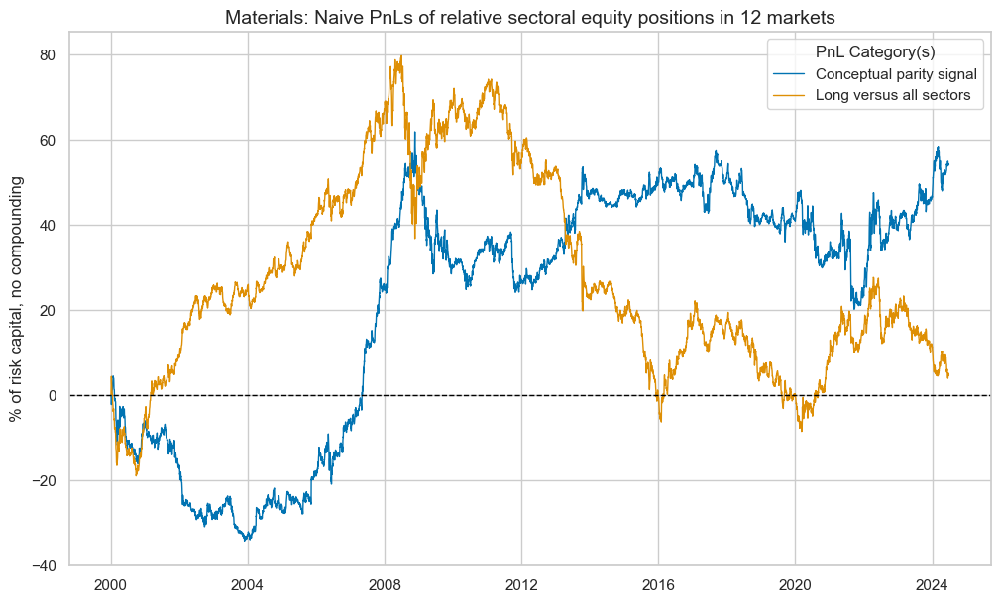

xcat,PNL_MAT_AVZ,Long only
Return %,2.21,0.19
St. Dev. %,10.00,10.00
Sharpe Ratio,0.22,0.02
Sortino Ratio,0.31,0.03
Max 21-Day Draw %,-14.14,-21.65
Max 6-Month Draw %,-26.52,-40.34
Peak to Trough Draw %,-41.69,-88.31
Top 5% Monthly PnL Share,1.79,19.19
Traded Months,294.00,294.00


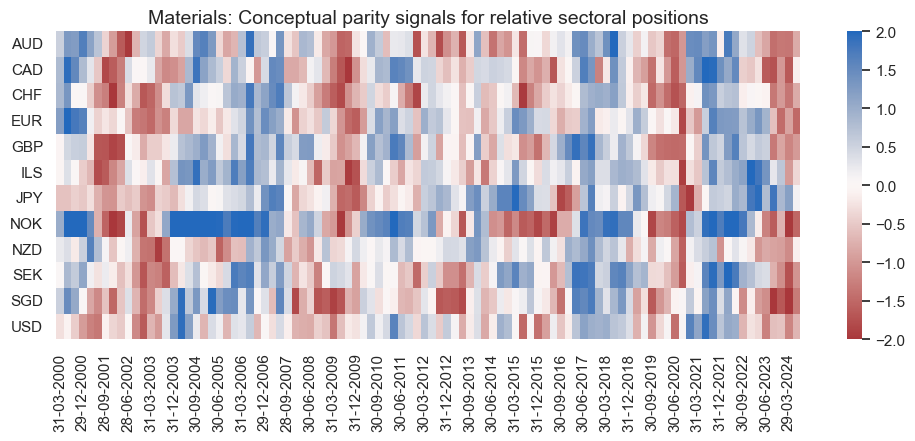

In [31]:
dix = mat_dict
sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Industrials sector

##### Factors and panel tests

In [32]:
sector = "IND"
label = "Industrials"

sigs = {
    "XEXPORTS_SA_P1M1ML12_3MMA_ZN": "Excess export growth, local currency, %oya, 3mma",
    "MBCSCORE_SA_WG_ZN": "Manufacturing confidence score, sa, weighted global",
    "MBCSCORE_SA_D3M3ML3_WG_ZN": "Manufacturing confidence score, diff 3m/3m, sar, weighted global",    
    "XCPIE_SA_P1M1ML12_ZN_NEG": "Excess energy CPI growth, %oya, negative",
    "REEROADJ_NSA_P1M12ML1_ZN_NEG": "Open.-adj. real appreciation, % vs prev. 12 months, negative",   
    "RYLDIRS05Y_NSA_ZN_NEG": "Real 5-year (IRS) interest rates, negative",
}

ind_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

XCPIE_SA_P1M1ML12_ZN_NEG misses: ['NZD'].


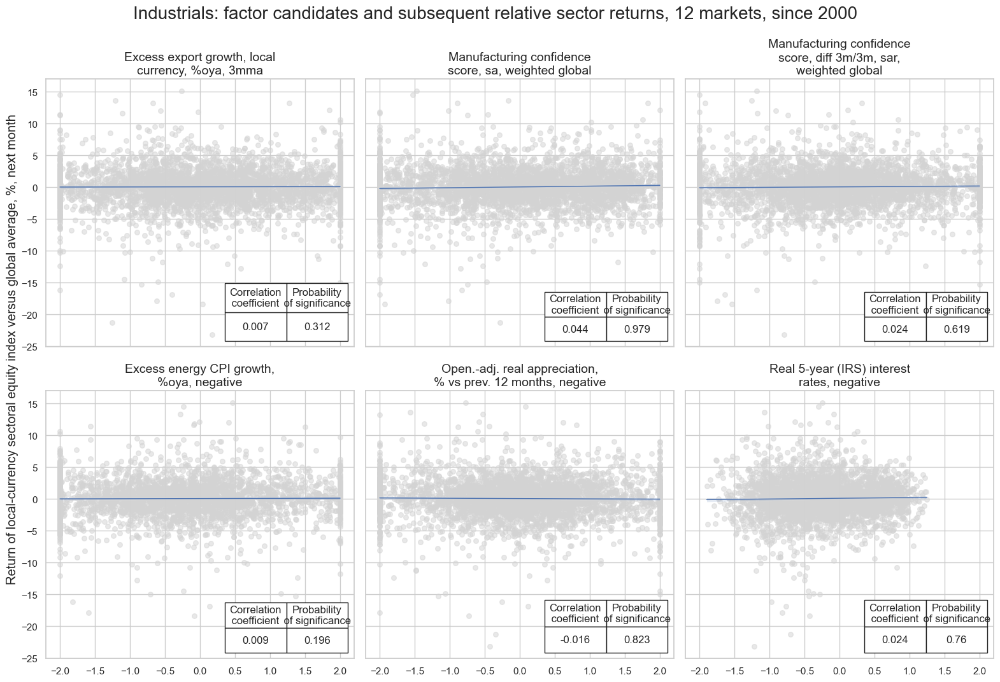

In [33]:
dix = ind_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel tests

In [34]:
# Calculate conceptual parity average z-score

dix = ind_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

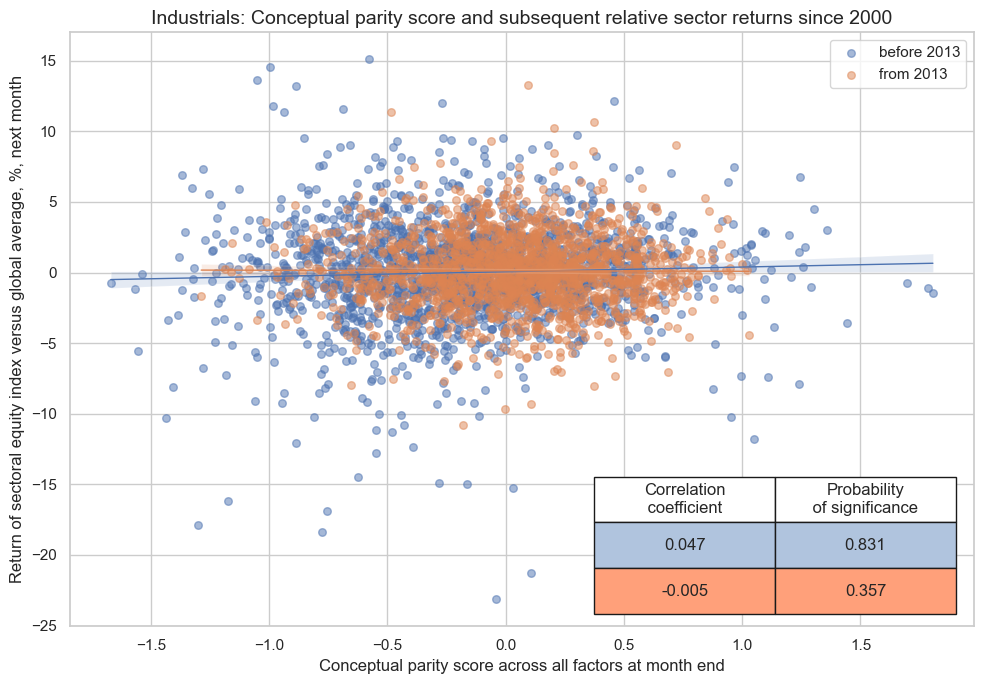

In [35]:
dix = ind_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [36]:
dix = ind_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

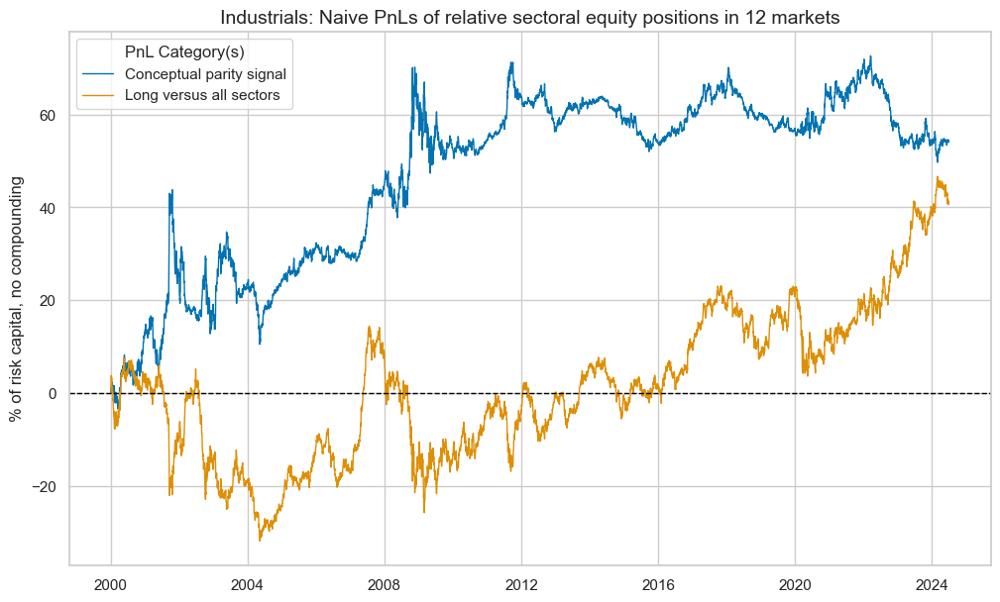

xcat,PNL_IND_AVZ,Long only
Return %,2.23,1.68
St. Dev. %,10.00,10.00
Sharpe Ratio,0.22,0.17
Sortino Ratio,0.32,0.23
Max 21-Day Draw %,-17.46,-18.51
Max 6-Month Draw %,-24.91,-24.98
Peak to Trough Draw %,-33.36,-40.26
Top 5% Monthly PnL Share,1.98,2.36
Traded Months,294.00,294.00


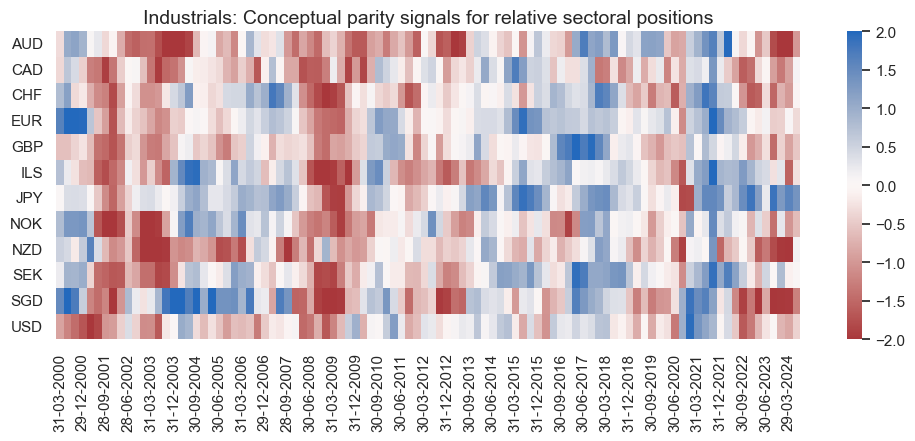

In [37]:
dix = ind_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Consumer discretionary sector

##### Factors and panel tests

In [38]:
sector = "COD"
label = "Consumer discretionary"

sigs = {
    "CCSCORE_SA_D3M3ML3_WG_ZN": "Consumer confidence score, diff 3m/3m, sa, weighted global",
    "CCSCORE_SA_WG_ZN_NEG": "Consumer confidence, score, sa, negative, weighted global",
    "XRPCONS_SA_P1M1ML12_3MMA_WG_ZN_NEG": "Excess private consumption, %oya, 3mma, negative, weighted global",
    "XRRSALES_SA_P1M1ML12_3MMA_WG_ZN_NEG": "Excess real retail sales, %oya, 3mma, negative, weighted global", 
    "XCPIH_SA_P1M1ML12_ZN_NEG": "Excess CPI inflation, %oya, negative",
    "RYLDIRS02Y_NSA_ZN_NEG": "Real 5-year (IRS) interest rates, negative",  
}

cod_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

CCSCORE_SA_D3M3ML3_WG_ZN misses: ['SGD'].
CCSCORE_SA_WG_ZN_NEG misses: ['SGD'].


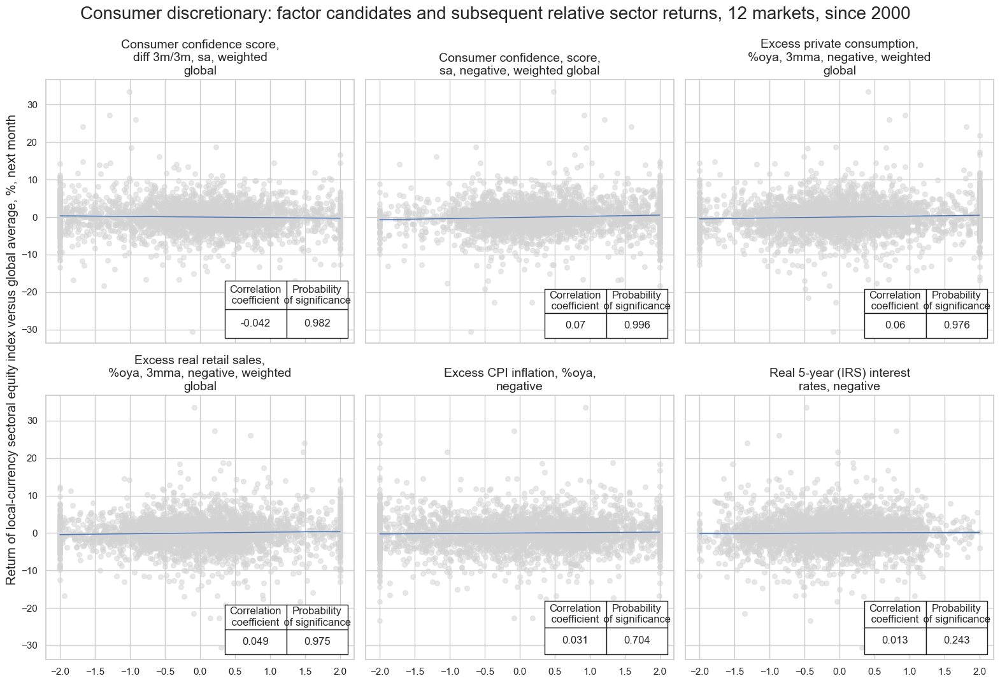

In [39]:
dix = cod_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel tests

In [40]:
# Calculate conceptual parity average z-score

dix = cod_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

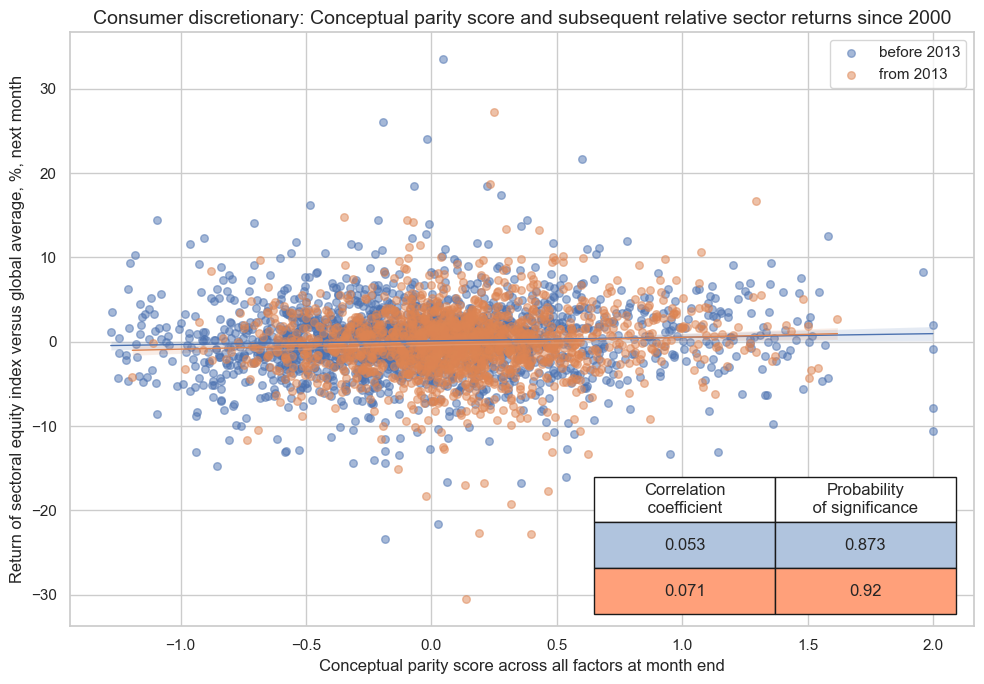

In [41]:
dix = cod_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [42]:
dix = cod_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

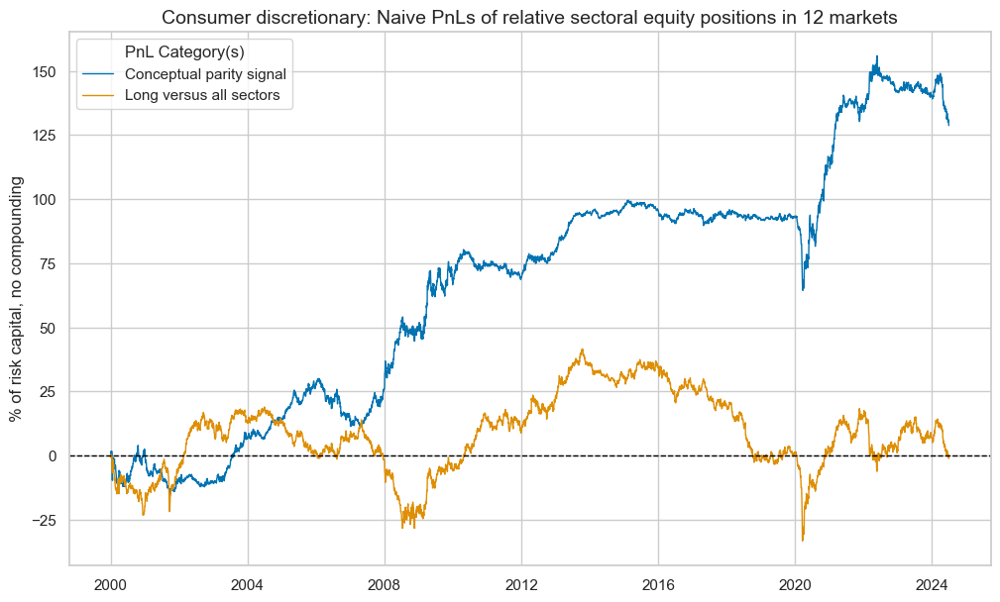

xcat,PNL_COD_AVZ,Long only
Return %,5.26,-0.05
St. Dev. %,10.00,10.00
Sharpe Ratio,0.53,-0.00
Sortino Ratio,0.77,-0.01
Max 21-Day Draw %,-24.03,-28.26
Max 6-Month Draw %,-28.11,-33.99
Peak to Trough Draw %,-35.22,-74.89
Top 5% Monthly PnL Share,0.95,-77.29
Traded Months,294.00,294.00


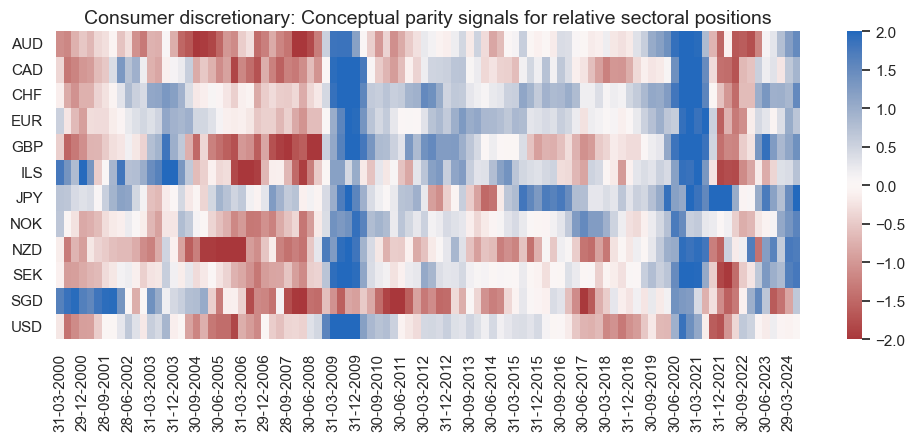

In [43]:
dix = cod_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Consumer staples sector

##### Factors and panel tests

In [44]:
sector = "COS"
label = "Consumer staples"

sigs = {
    "XEMPL_NSA_P1M1ML12_3MMA_ZN": "Excess employment growth, %oya, 3mma",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12_ZN_NEG": "Unemployment rate, diff oya, 3mma, negative",
    "XNRSALES_SA_P1M1ML12_3MMA_ZN": "Excess nominal retail sales growth, %oya, 3mma",
    "XRWAGES_NSA_P1M1ML12_ZN": "Excess real wage growth, %oya",
    "XCPIF_SA_P1M1ML12_ZN": "Excess CPI food inflation, %oya",
    "RYLDIRS05Y_NSA_ZN": "Real 2-year (IRS) interest rates",
}

cos_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

XCPIF_SA_P1M1ML12_ZN misses: ['NZD'].


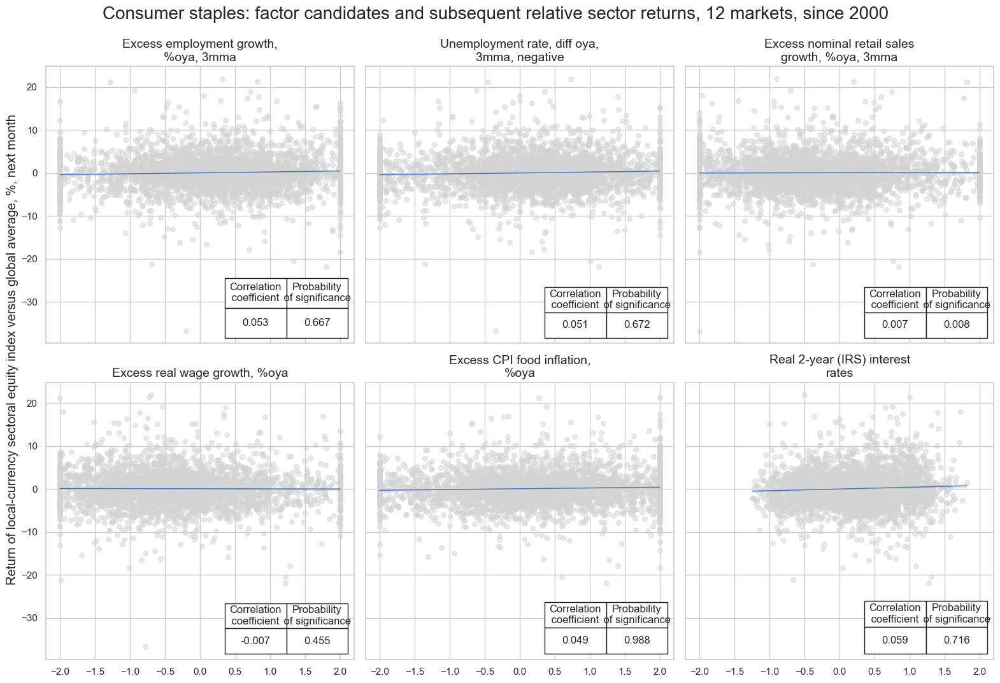

In [45]:
dix = cos_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel tests

In [46]:
# Calculate conceptual parity average z-score

dix = cos_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

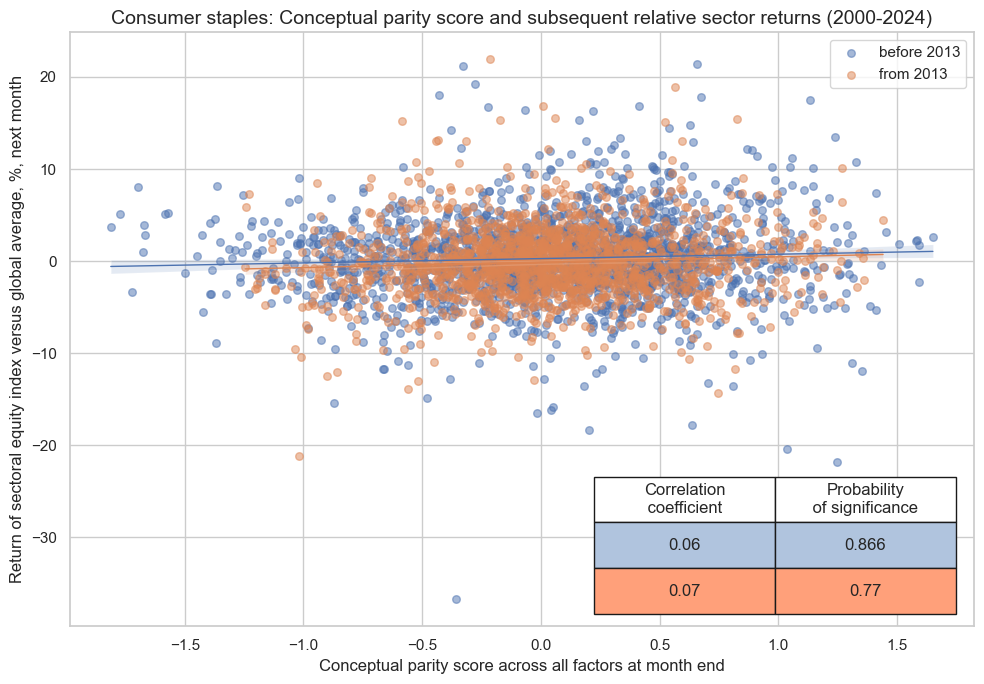

In [47]:
dix = cos_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=dix["start"],
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns (2000-2024)",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [48]:
dix = cos_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

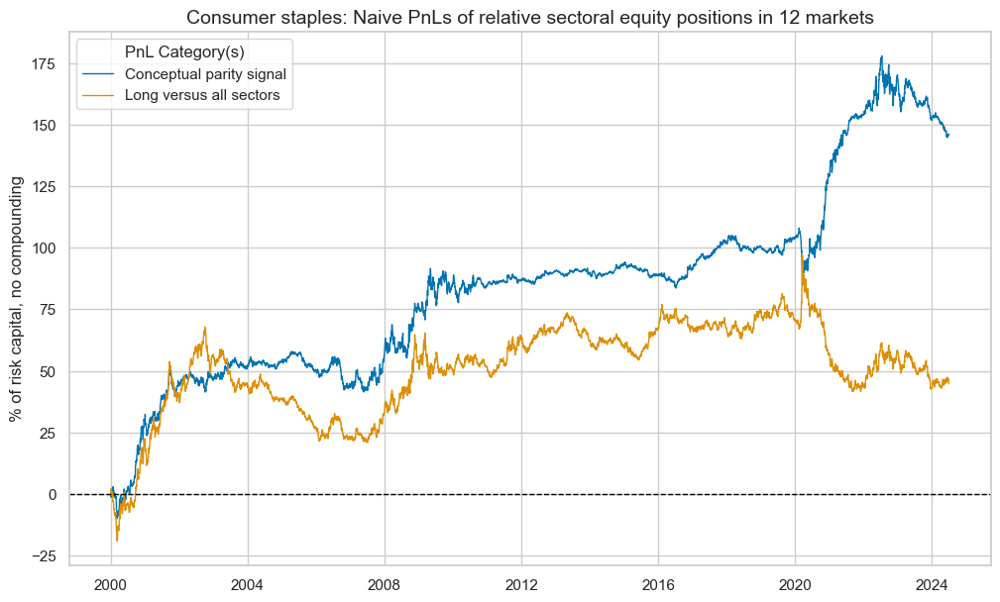

xcat,PNL_COS_AVZ,Long only
Return %,5.96,1.83
St. Dev. %,10.00,10.00
Sharpe Ratio,0.60,0.18
Sortino Ratio,0.86,0.26
Max 21-Day Draw %,-21.55,-13.56
Max 6-Month Draw %,-18.26,-25.45
Peak to Trough Draw %,-33.23,-55.41
Top 5% Monthly PnL Share,0.90,2.88
Traded Months,294.00,294.00


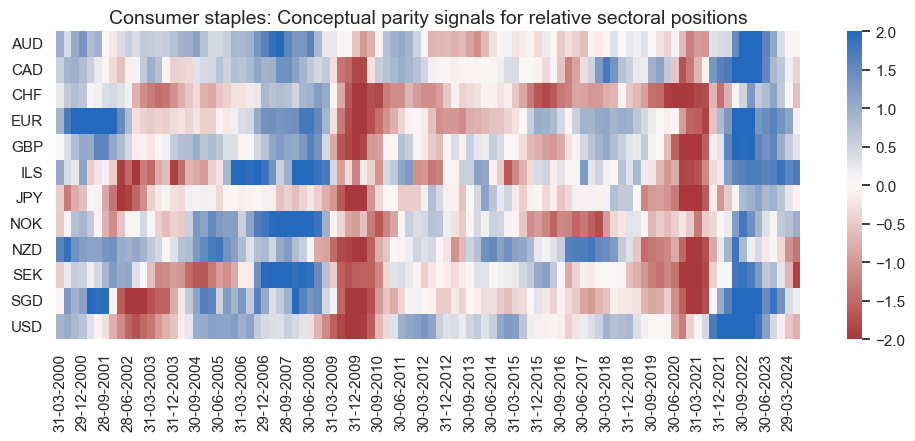

In [49]:
dix = cos_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Healthcare sector

##### Factors and panel tests

In [50]:
sector = "HLC"
label = "Health care"

sigs = {
    "SBCSCORE_SA_ZN": "Services business confidence score, sa",
    "SBCSCORE_SA_D3M3ML3_ZN": "Services business confidence score, diff 3m/3m, sa",
    "XRGDPTECH_SA_P1M1ML12_3MMA_ZN": "Excess 'technical' GDP growth, %oya, 3mma",
    "CBCSCORE_SA_ZN": "Consumer confidence, score, sa",   
    "XCPIC_SA_P1M1ML12_ZN": "Excess core CPI inflation, %oya", 
    "RYLDIRS02Y_NSA_ZN": "Real 2-year (IRS) interest rates", # Comparatively vs other sectors
}

hlc_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

SBCSCORE_SA_ZN misses: ['NOK'].
SBCSCORE_SA_D3M3ML3_ZN misses: ['NOK'].
CBCSCORE_SA_ZN misses: ['AUD', 'GBP', 'NOK', 'NZD', 'SGD'].


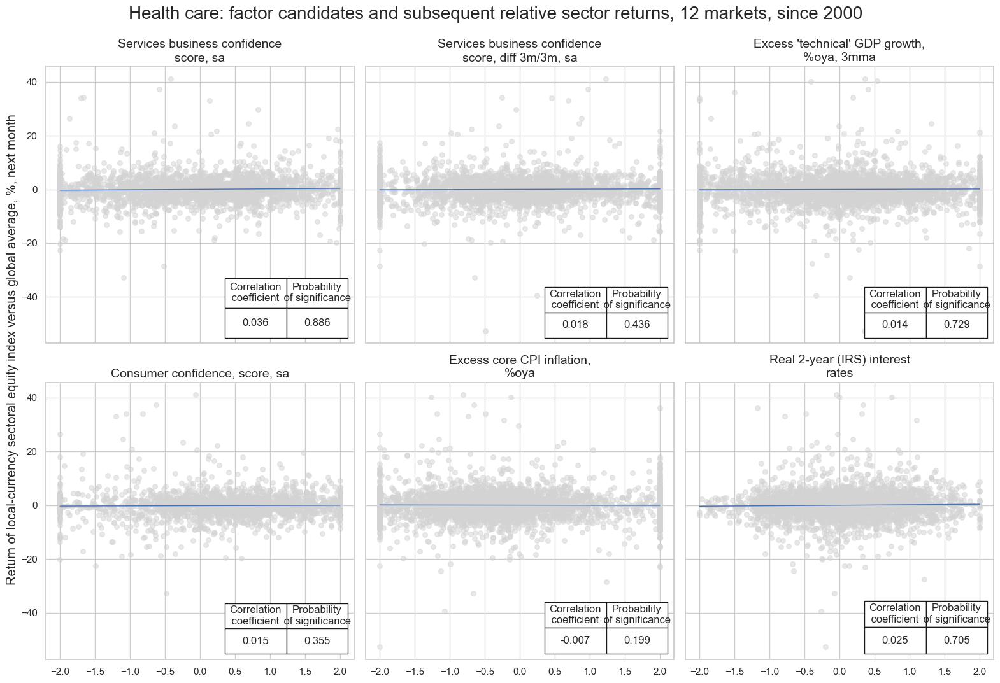

In [51]:
dix = hlc_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel test

In [52]:
# Calculate conceptual parity average z-score

dix = hlc_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

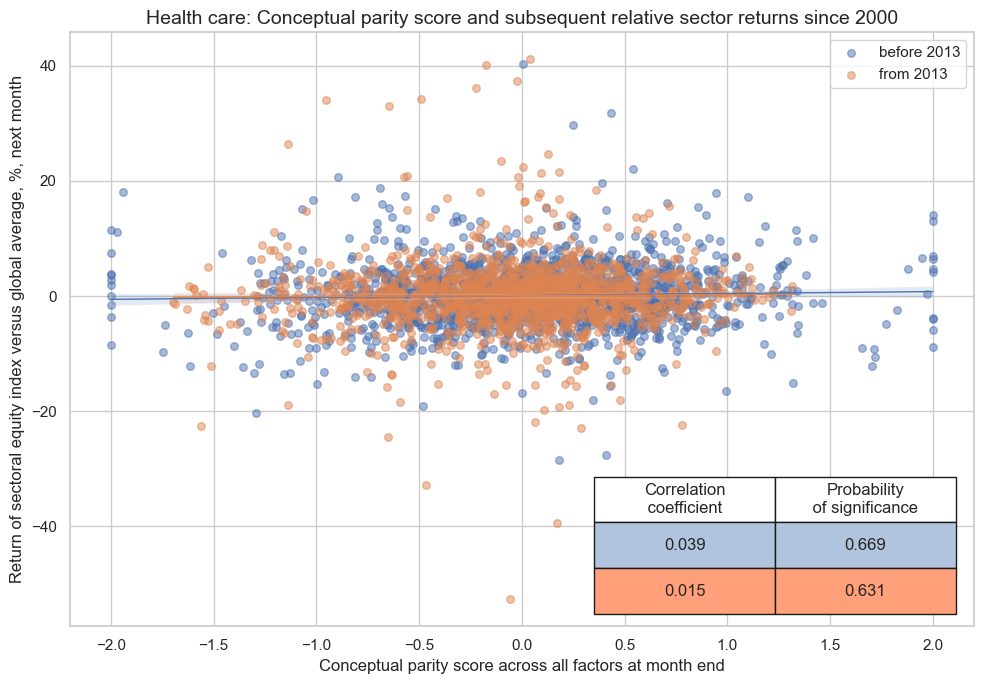

In [53]:
dix = hlc_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [54]:
dix = hlc_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

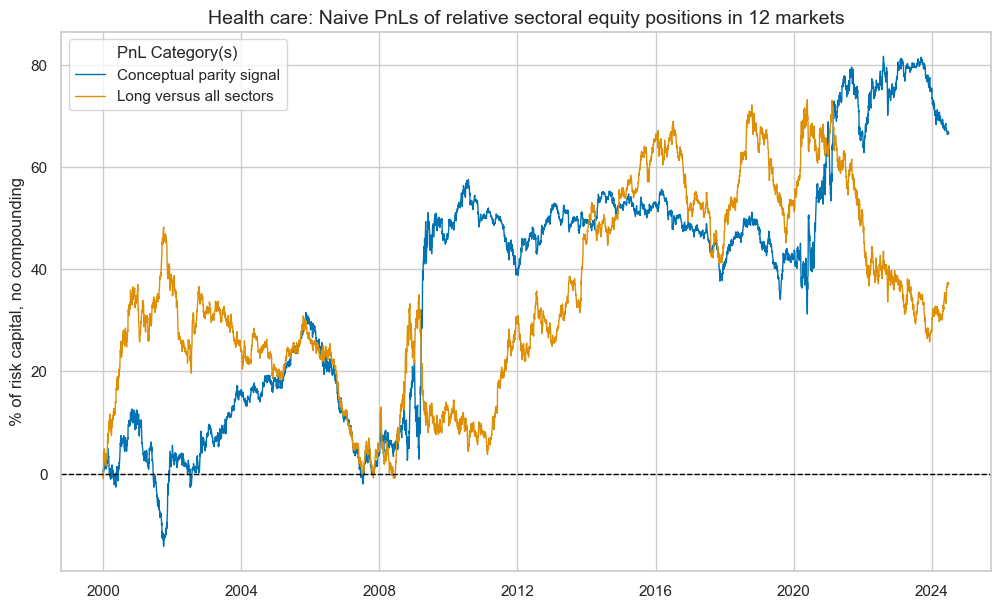

xcat,PNL_HLC_AVZ,Long only
Return %,2.72,1.52
St. Dev. %,10.00,10.00
Sharpe Ratio,0.27,0.15
Sortino Ratio,0.40,0.22
Max 21-Day Draw %,-14.66,-16.61
Max 6-Month Draw %,-18.15,-25.61
Peak to Trough Draw %,-33.59,-49.16
Top 5% Monthly PnL Share,1.92,2.97
Traded Months,294.00,294.00


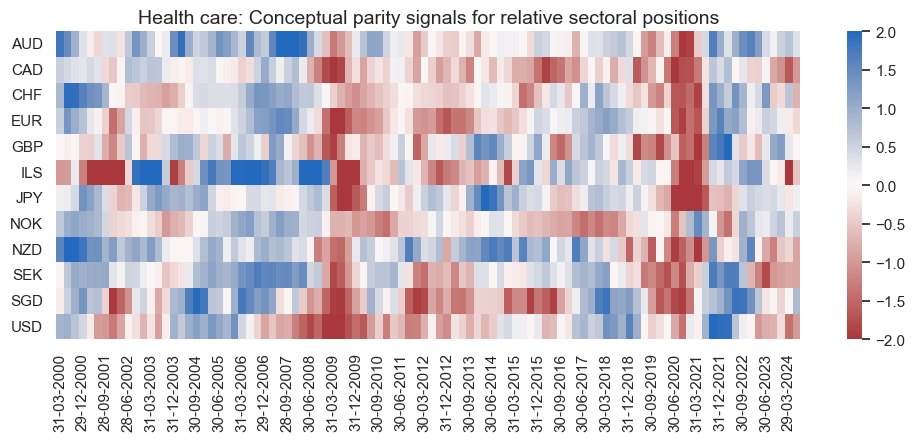

In [55]:
dix = hlc_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Financial sector

##### Factors and panel tests

##### Specs and panel tests

In [56]:
sector = "FIN"
label = "Financials"

sigs = {
    "XPCREDITBN_SJA_P1M1ML12_ZN": "Excess private credit growth, %oya",
    "UNEMPLRATE_SA_3MMAv5YMA_ZN": "Unemployment rate, sa, 3mma vs. prev. 5yma",
    "CORPINTNETGDP_SA_D1Q1QL4_ZN_NEG": "Corporate debt service ratio, % of GDP, diff oya, negative",
    "HHINTNETGDP_SA_D1M1ML12_ZN_NEG": "Household debt service ratio, % of GDP, diff oya, negative",
    "XGGDGDPRATIOX10_NSA_ZN_NEG": "Excess extrapol. government debt ratio, % of GDP, negative",
    "RSLOPEMIDDLE_NSA_ZN": "Real 5-year/2-year IRS yield spread, % ar",
}

fin_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

CORPINTNETGDP_SA_D1Q1QL4_ZN_NEG misses: ['ILS', 'SEK', 'SGD'].
HHINTNETGDP_SA_D1M1ML12_ZN_NEG misses: ['ILS', 'SEK', 'SGD'].
XGGDGDPRATIOX10_NSA_ZN_NEG misses: ['SGD'].


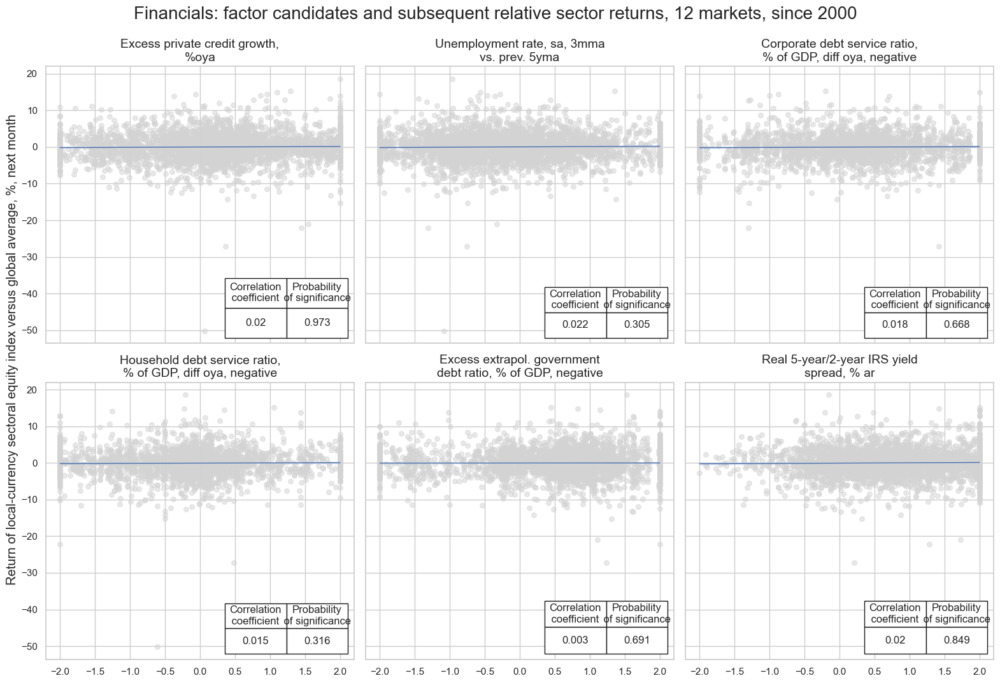

In [57]:
dix = fin_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel test

In [58]:
# Calculate conceptual parity average z-score

dix = fin_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

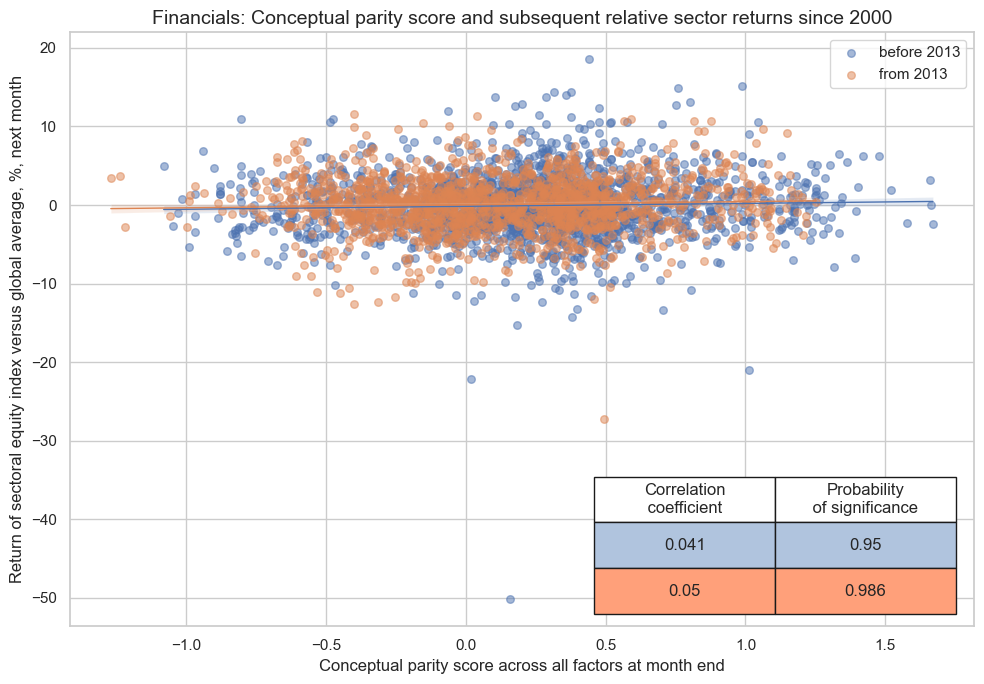

In [59]:
dix = fin_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [60]:
dix = fin_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

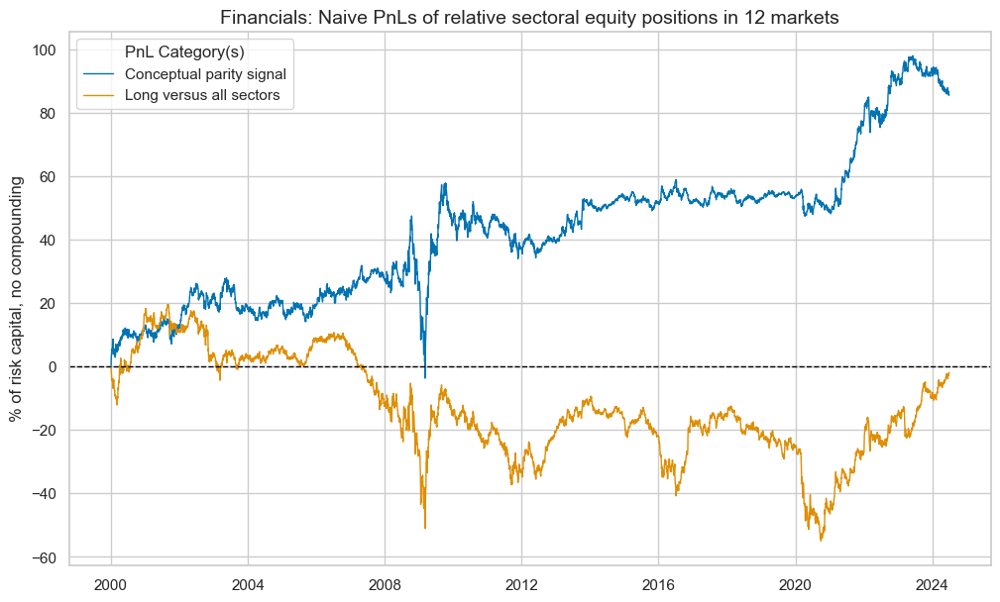

xcat,PNL_FIN_AVZ,Long only
Return %,3.49,-0.07
St. Dev. %,10.00,10.00
Sharpe Ratio,0.35,-0.01
Sortino Ratio,0.53,-0.01
Max 21-Day Draw %,-17.87,-17.81
Max 6-Month Draw %,-39.50,-36.88
Peak to Trough Draw %,-51.19,-74.53
Top 5% Monthly PnL Share,1.39,-57.41
Traded Months,294.00,294.00


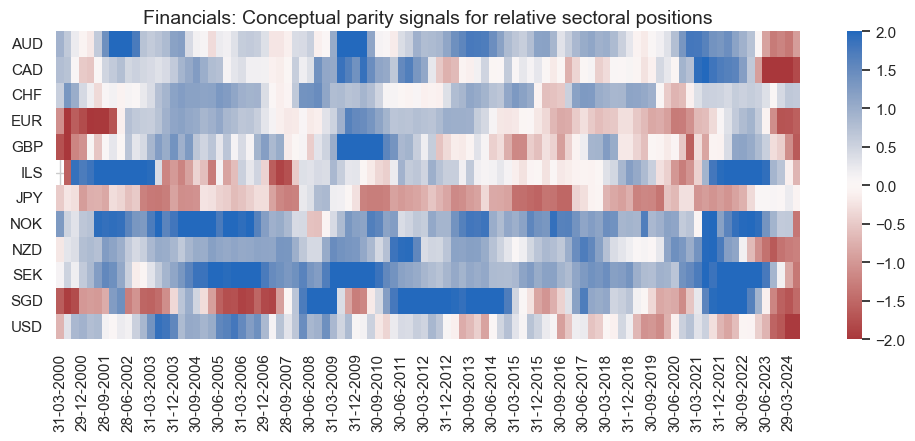

In [61]:
dix = fin_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Information technology sector

##### Factors and panel tests

In [62]:
sector = "ITE"
label = "Information technology"

sigs = {
    "XRPCONS_SA_P1M1ML12_3MMA_WG_ZN_NEG": "Excess private consumption, %oya, 3mma, negative",
    "MBCSCORE_SA_WG_ZN_NEG": "Manufacturing confidence score, sa, negative",
    "MBCSCORE_SA_D3M3ML3_WG_ZN_NEG": "Manufacturing confidence score, diff 3m/3m, sa, negative",
    "SBCSCORE_SA_ZN_NEG": "Services business confidence score, sa, negative", 
    "XCPIH_SA_P1M1ML12_ZN_NEG": "Excess CPI inflation, %oya, negative",
    "RYLDIRS02Y_NSA_ZN_NEG": "Real 2-year (IRS) interest rates, negative",
}

ite_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

SBCSCORE_SA_ZN_NEG misses: ['NOK'].


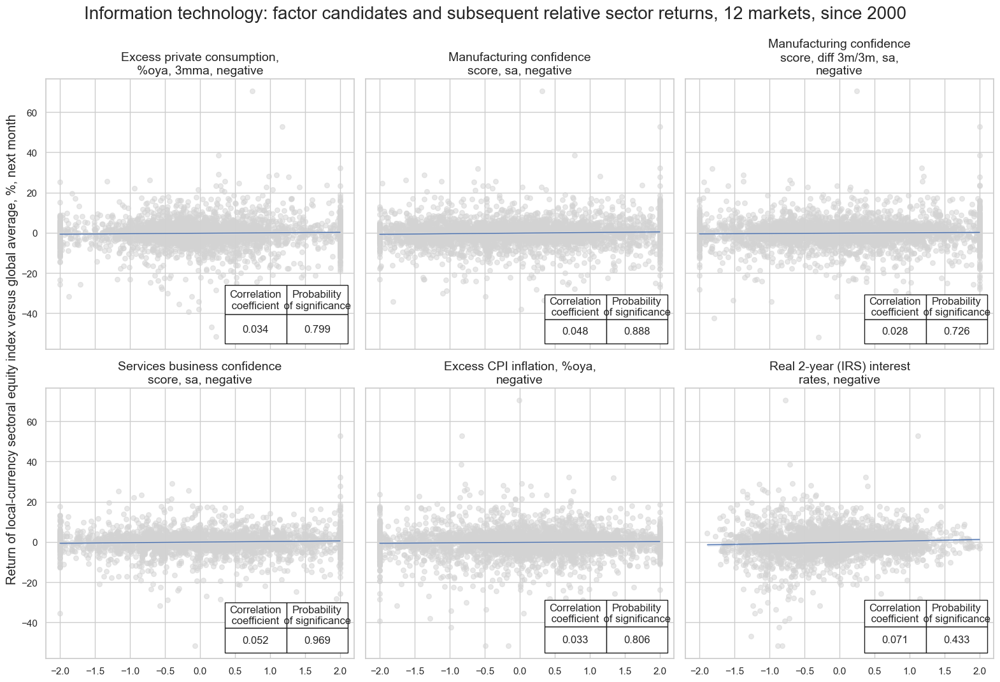

In [63]:
dix = ite_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel test

In [64]:
# Calculate conceptual parity average z-score

dix = ite_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

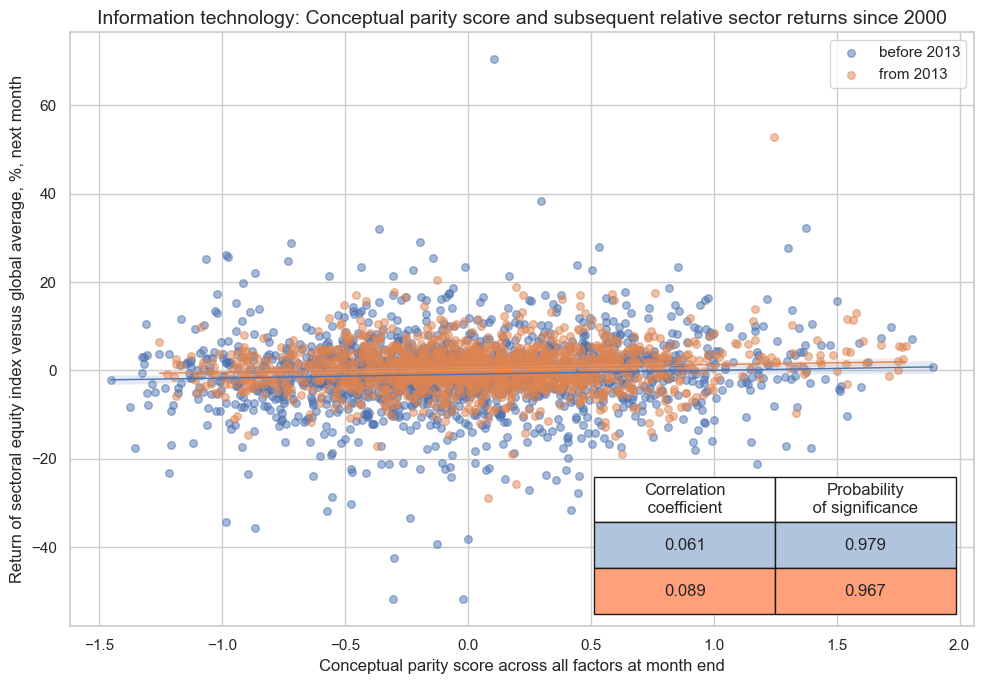

In [65]:
dix = ite_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [66]:
dix = ite_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

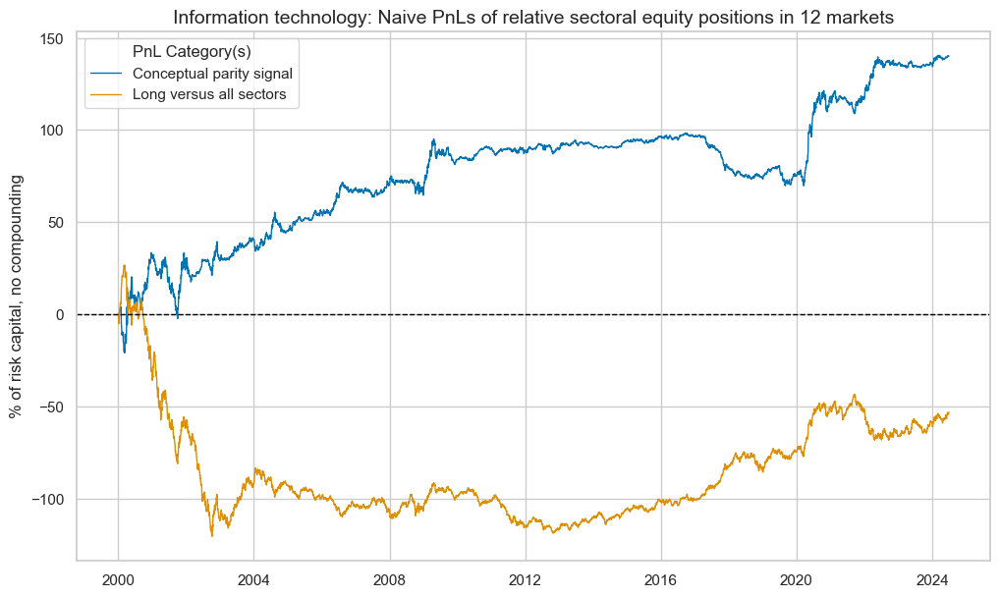

xcat,PNL_ITE_AVZ,Long only
Return %,5.73,-2.16
St. Dev. %,10.00,10.00
Sharpe Ratio,0.57,-0.22
Sortino Ratio,0.86,-0.30
Max 21-Day Draw %,-21.29,-22.93
Max 6-Month Draw %,-23.21,-52.76
Peak to Trough Draw %,-35.67,-147.06
Top 5% Monthly PnL Share,1.10,-2.40
Traded Months,294.00,294.00


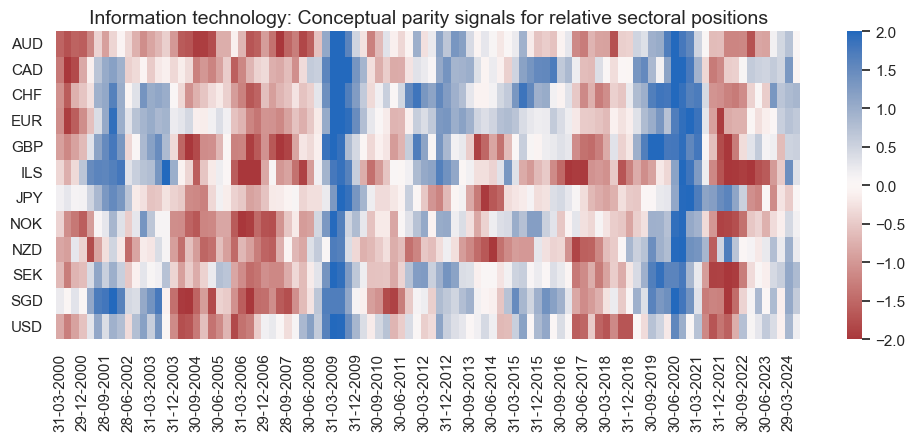

In [67]:
dix = ite_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Communication services sector

##### Factors and panel tests

##### Specs and panel tests

In [68]:
sector = "CSR"
label = "Communication services"

sigs = {
    "SBCSCORE_SA_ZN": "Services business confidence score, sa", 
    "SBCSCORE_SA_D3M3ML3_ZN": "Services confidence score, sa, diff 3m/3m",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12_ZN_NEG": "Unemployment rate, diff oya, 3mma, negative",  
    "XCPIC_SA_P1M1ML12_ZN": "Excess core CPI inflation, %oya",
    "REEROADJ_NSA_P1M12ML1_ZN": "Open.-adj. real appreciation, % vs prev. 12 months",
    "RYLDIRS02Y_NSA_ZN_NEG": "Real 2-year (IRS) interest rates, negative",
}

csr_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

SBCSCORE_SA_ZN misses: ['NOK'].
SBCSCORE_SA_D3M3ML3_ZN misses: ['NOK'].


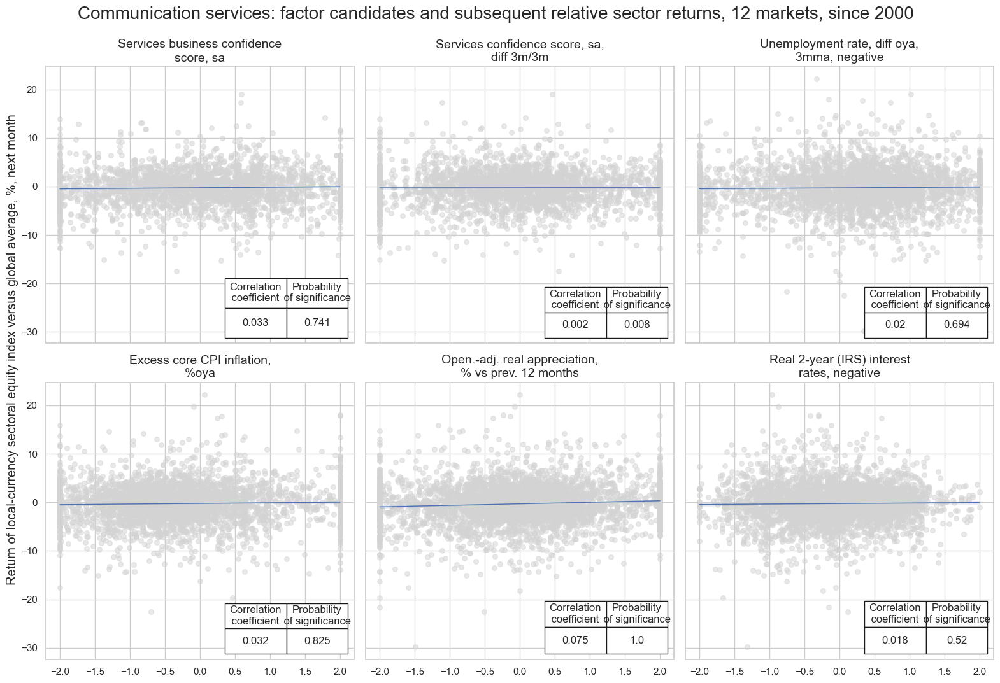

In [69]:
dix = csr_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel test

In [70]:
# Calculate conceptual parity average z-score

dix = csr_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

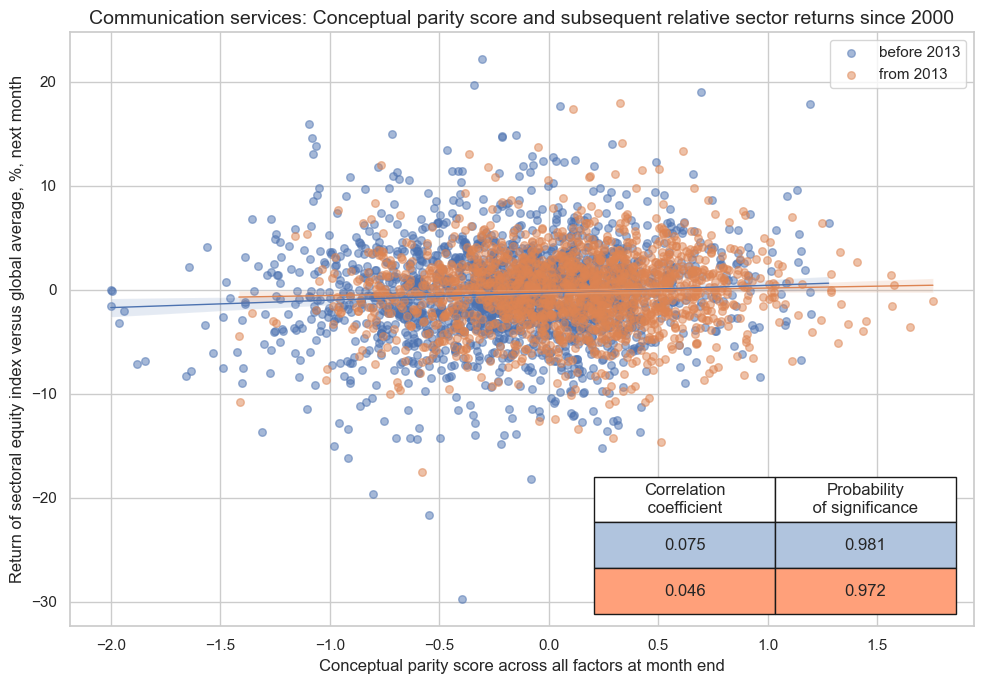

In [71]:
dix = csr_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [72]:
dix = csr_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

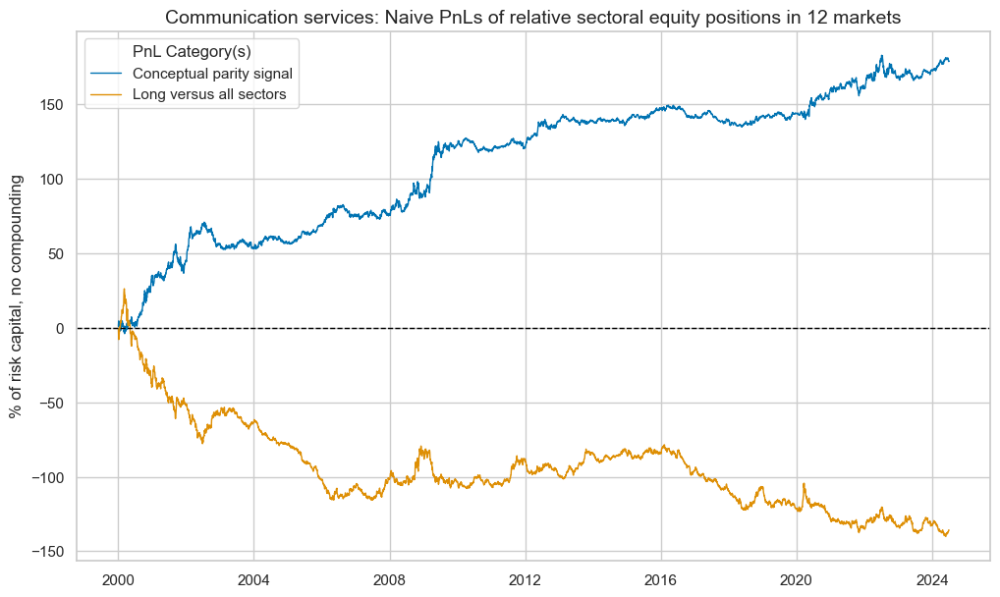

xcat,PNL_CSR_AVZ,Long only
Return %,7.32,-5.54
St. Dev. %,10.00,10.00
Sharpe Ratio,0.73,-0.55
Sortino Ratio,1.08,-0.77
Max 21-Day Draw %,-14.41,-21.61
Max 6-Month Draw %,-16.45,-45.65
Peak to Trough Draw %,-19.57,-166.35
Top 5% Monthly PnL Share,0.65,-0.76
Traded Months,294.00,294.00


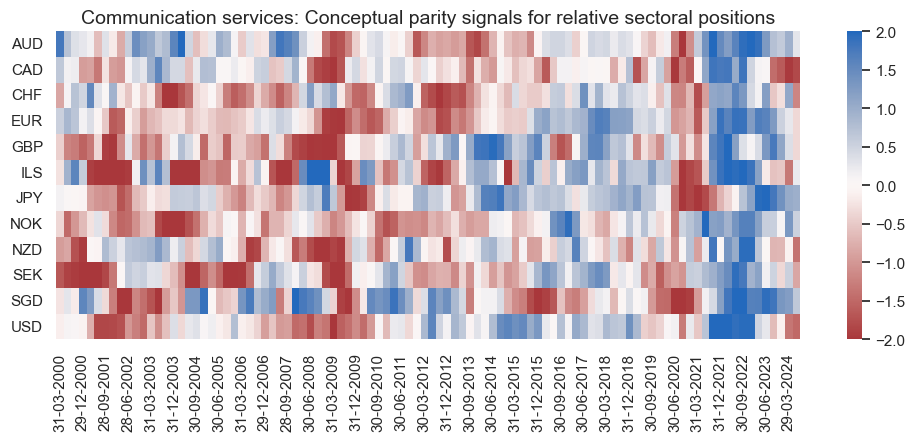

In [73]:
dix = csr_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Utilities sector

##### Factors and panel tests

In [74]:
sector = "UTL"
label = "Utilities"

sigs = {
    "XRGDPTECH_SA_P1M1ML12_3MMA_ZN": "Excess GDP growth (nowcast), %oya, 3mma",
    "XIP_SA_P1M1ML12_3MMA_ZN": 'Excess industrial production growth, %oya, 3mma',
    "MBCSCORE_SA_ZN": "Manufacturing confidence score, sa",
    "SBCSCORE_SA_ZN": "Services business confidence score, sa", 
    "CBCSCORE_SA_ZN": "Construction business confidence score, sal",
    "XCPIE_SA_P1M1ML12_ZN": "Excess energy CPI inflation, %oya",
}

utl_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

SBCSCORE_SA_ZN misses: ['NOK'].
CBCSCORE_SA_ZN misses: ['AUD', 'GBP', 'NOK', 'NZD', 'SGD'].
XCPIE_SA_P1M1ML12_ZN misses: ['NZD'].


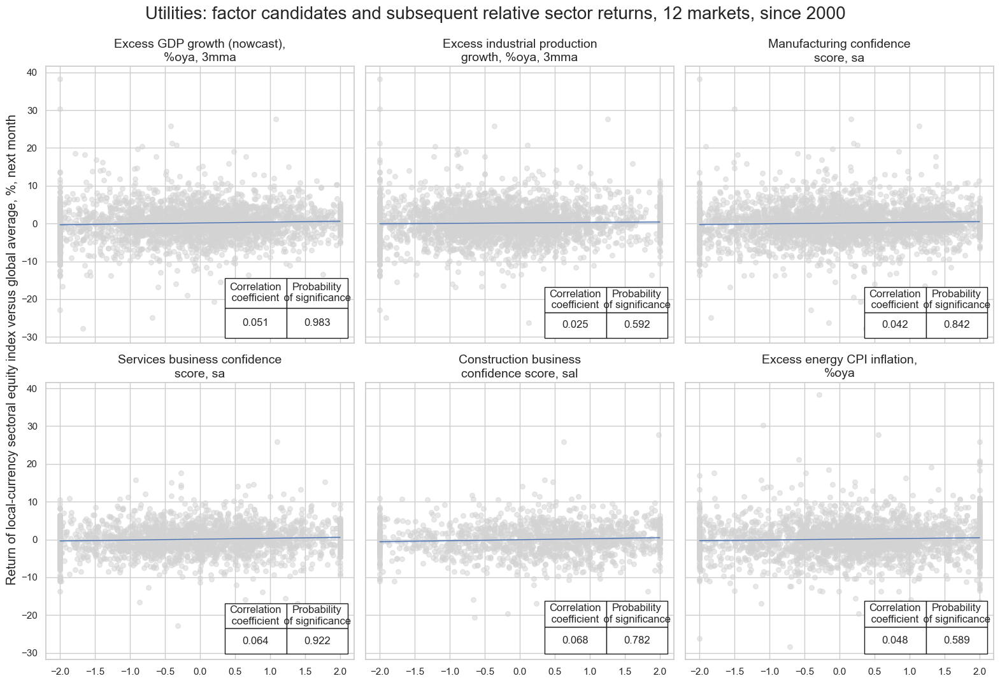

In [75]:
dix = utl_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel test

In [76]:
# Calculate conceptual parity average z-score

dix = utl_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

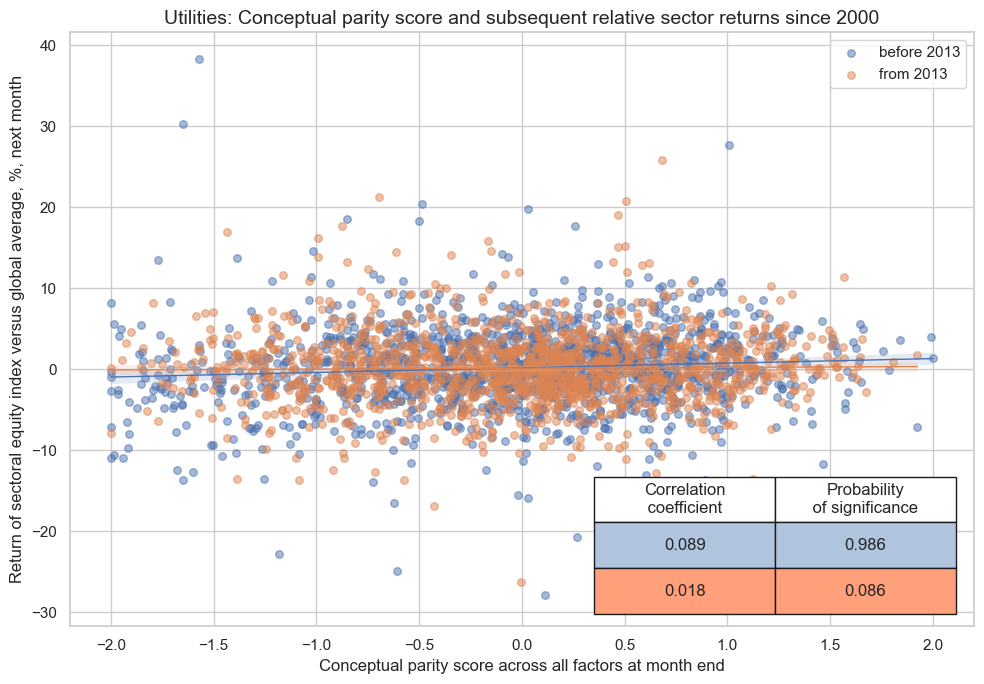

In [77]:
dix = utl_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [78]:
dix = utl_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

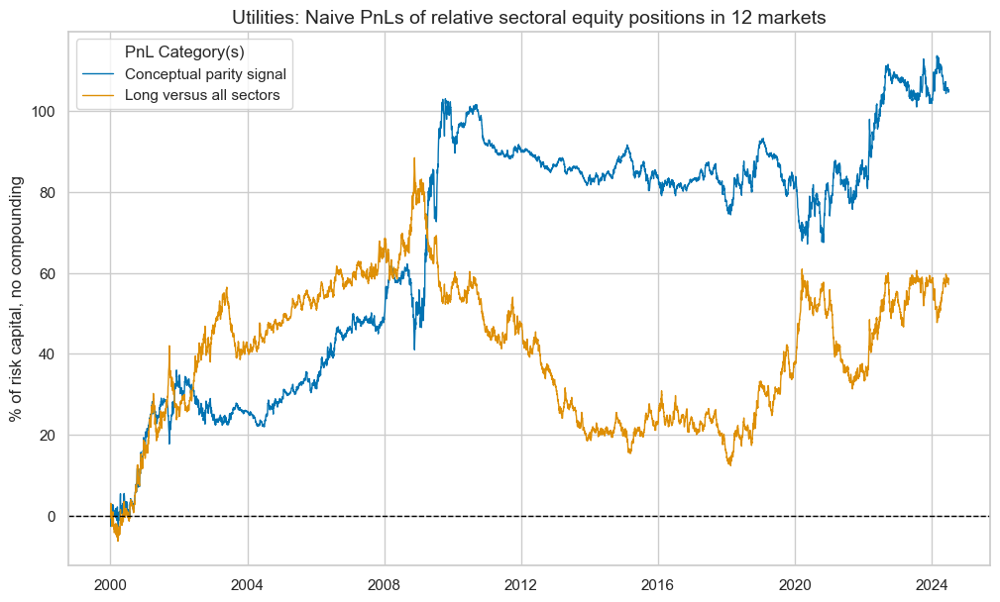

xcat,PNL_UTL_AVZ,Long only
Return %,4.30,2.33
St. Dev. %,10.00,10.00
Sharpe Ratio,0.43,0.23
Sortino Ratio,0.65,0.34
Max 21-Day Draw %,-13.55,-12.44
Max 6-Month Draw %,-16.73,-25.68
Peak to Trough Draw %,-35.91,-76.06
Top 5% Monthly PnL Share,1.20,1.76
Traded Months,294.00,294.00


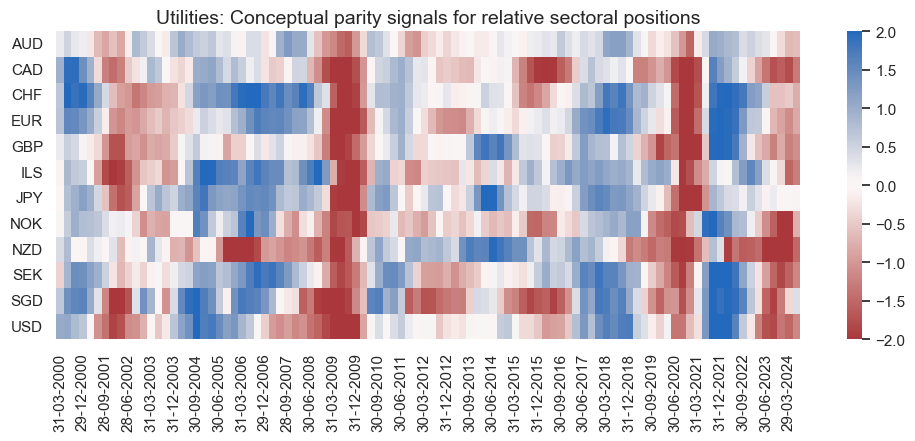

In [79]:
dix = utl_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

### Real estate sector

##### Specs and panel tests

In [80]:
sector = "REL"
label = "Real estate"

sigs = {
    "CBCSCORE_SA_ZN": "Construction business confidence score, sa",
    "CBCSCORE_SA_D3M3ML3_ZN": "Construction business confidence score, sa, diff 3m/3m",
    "SBCSCORE_SA_ZN": "Services business confidence score, sa",
    "SBCSCORE_SA_D3M3ML3_ZN": "Services business confidence score, sa, diff 3m/3m",
    "CCSCORE_SA_ZN": "Consumer confidence score, sa",
    'XCPIH_SA_P1M1ML12_ZN_NEG': "Excess CPI inflation, %oya, negative",
}

rel_dict = {
    "sname": label,
    "avz": f"{sector}_AVZ",
    "sigx": list(sigs.keys()),
    "signs": list(sigs.values()),
    "ret": f"EQC{sector}R_NSAvALL",
    "cidx": cids_eqx,
    "freq": "M",
    "start": "2000-01-01",
    "black": None,
    "srr": None,
    "pnls": None,
}

CBCSCORE_SA_ZN misses: ['AUD', 'GBP', 'NOK', 'NZD', 'SGD'].
CBCSCORE_SA_D3M3ML3_ZN misses: ['AUD', 'GBP', 'NOK', 'NZD', 'SGD'].
SBCSCORE_SA_ZN misses: ['NOK'].
SBCSCORE_SA_D3M3ML3_ZN misses: ['NOK'].
CCSCORE_SA_ZN misses: ['SGD'].


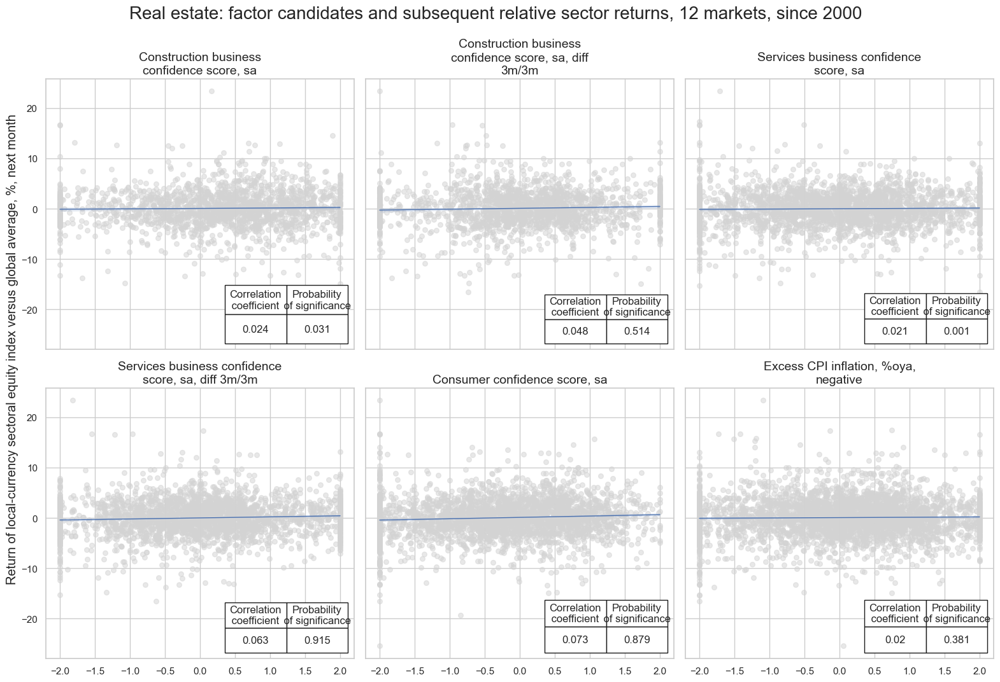

In [81]:
dix = rel_dict

sname = dix["sname"]
sigx = dix['sigx']
signs = dix["signs"]
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

catregs = {}
for sig in sigx:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=3,
    nrow=2,
    figsize=(16, 11),
    title=f"{sname}: factor candidates and subsequent relative sector returns, 12 markets, since 2000",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab="Return of local-currency sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=signs,
)

#### Conceptual parity and panel test

In [82]:
# Calculate conceptual parity average z-score

dix = rel_dict

sigx = dix['sigx']
cidx = dix["cidx"]
freq = dix["freq"]
start = dix["start"]

dfa = msp.linear_composite(
    df=dfx,
    xcats=sigx,
    complete_xcats=False,
    cids=cidx,
    new_xcat=dix['avz'],
    start=start,
)
dfx = msm.update_df(dfx, dfa)

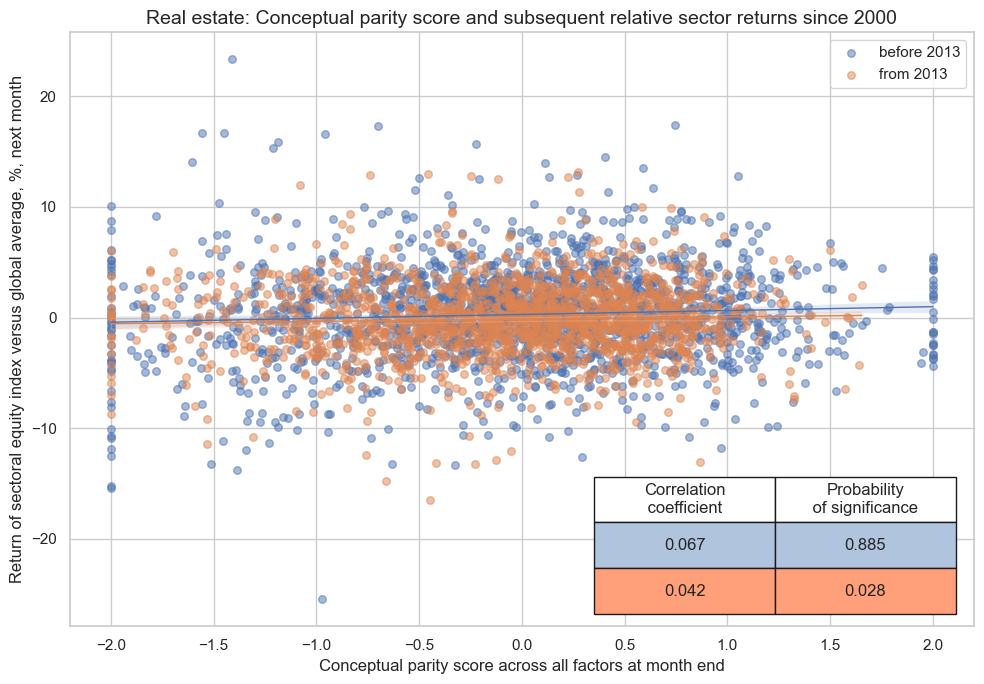

In [83]:
dix = rel_dict

sname = dix["sname"]
avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
start = dix["start"]
freq = dix["freq"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[avz, ret],
    cids=dix["cidx"],
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
)

cr.reg_scatter(
    title=f"{sname}: Conceptual parity score and subsequent relative sector returns since 2000",
    labels=False,
    prob_est="map",
    separator=2013,
    xlab="Conceptual parity score across all factors at month end",
    ylab="Return of sectoral equity index versus global average, %, next month",
    coef_box="lower right",
    size=(10, 7),
)

#### Conceptual parity and naive PnL

In [84]:
dix = rel_dict

avz = dix['avz']
ret = dix['ret']
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]
start = dix["start"]


pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=[avz],
    cids=cidx,
    start=start,
    blacklist=blax,
)

pnls.make_pnl(
    sig=avz,
    sig_op="zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    rebal_slip=1,
    vol_scale=10,
    thresh=2,
)
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

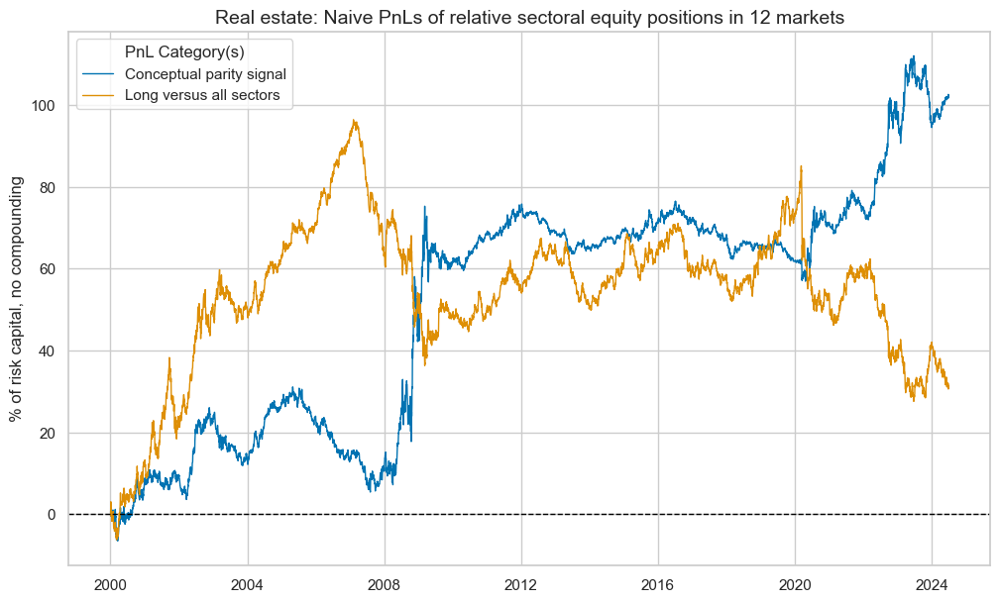

xcat,PNL_REL_AVZ,Long only
Return %,4.16,1.30
St. Dev. %,10.00,10.00
Sharpe Ratio,0.42,0.13
Sortino Ratio,0.61,0.18
Max 21-Day Draw %,-14.85,-20.79
Max 6-Month Draw %,-15.06,-33.19
Peak to Trough Draw %,-25.71,-68.87
Top 5% Monthly PnL Share,1.13,2.99
Traded Months,294.00,294.00


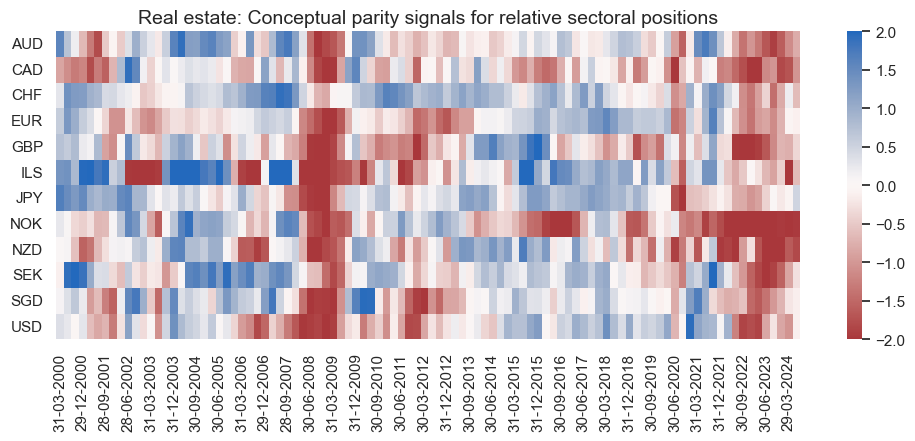

In [85]:
dix = rel_dict

sname = dix["sname"]
pnls = dix["pnls"]

pnls.plot_pnls( 
    title=f"{sname}: Naive PnLs of relative sectoral equity positions in 12 markets",
    title_fontsize=14,
    xcat_labels=["Conceptual parity signal", "Long versus all sectors"],
)

df_eval = pnls.evaluate_pnls(pnl_cats = [f"PNL_{avz}", "Long only"])
display(df_eval.astype("float").round(2))

pnls.signal_heatmap(
    pnl_name=f"PNL_{avz}",
    title=f"{sname}: Conceptual parity signals for relative sectoral positions",
    freq="q",
    start="2000-01-01",
    figsize=(12, 4),
)

## Combination of sector equity factors

In [86]:
secs = ["enr", "mat", "ind", "cod", "cos", "hlc", "fin", "ite", "csr", "utl", "rel"]
slabs =[]

ma_pnl = msn.MultiPnL()
for sec in secs:
    ma_pnl.add_pnl(globals()[f"{sec}_dict"]["pnls"], pnl_xcats=[f"PNL_{sec.upper()}_AVZ"])
    slabs += [globals()[f"{sec}_dict"]["sname"]]

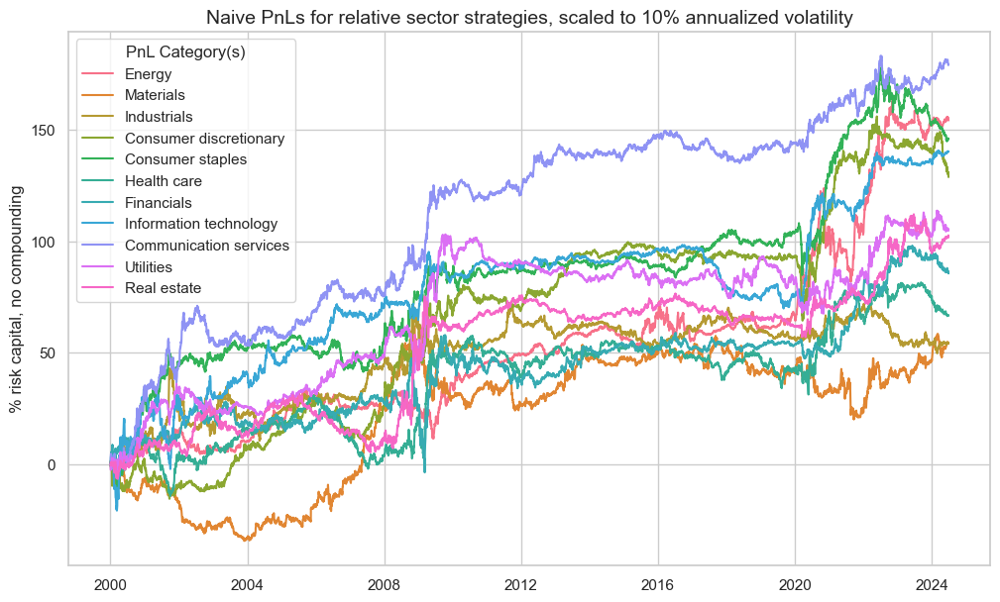

In [87]:
ma_pnl.plot_pnls(
    pnl_xcats=[
        f"PNL_{sec.upper()}_AVZ" for sec in secs
    ],
    title="Naive PnLs for relative sector strategies, scaled to 10% annualized volatility",
    xcat_labels=slabs,
)

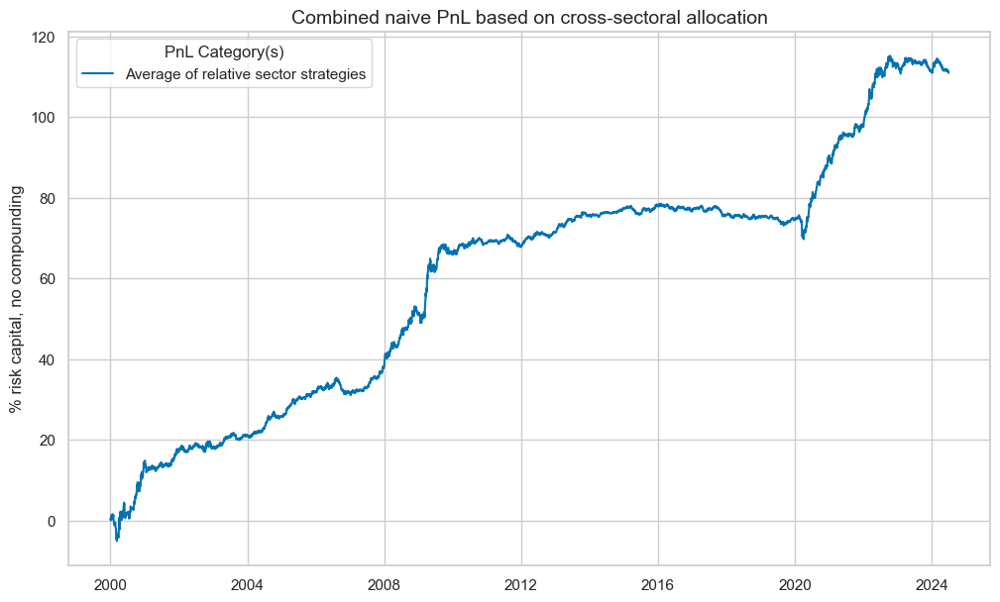

In [88]:
macro_sector_pnl = ma_pnl.combine_pnls(
    pnl_xcats=[f"PNL_{sec.upper()}_AVZ" for sec in secs],
    composite_pnl_xcat="Average of relative sector strategies",
    weights=None,
)
ma_pnl.plot_pnls(
    ["Average of relative sector strategies"],
    title="Combined naive PnL based on cross-sectoral allocation",
)

In [89]:
tbr = ma_pnl.evaluate_pnls()

dict_pnames = {
    f"PNL_{sec.upper()}_AVZ/EQC{sec.upper()}R_NSAvALL": sector_labels[sec.upper()] for sec in secs
}
tbr = tbr.iloc[[i for i in range(len(tbr)) if i != 1], :]
tbr.rename(columns=dict_pnames, inplace=True)

tbr = tbr.style.format("{:.2f}").set_caption(
    f"Naive PnL statistics for customised sector equity indices strategies").set_table_styles(
    [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}])

display(tbr)

,Energy,Materials,Industrials,Cons. discretionary,Cons. staples,Healthcare,Financials,Information tech,Communication services,Utilities,Real estate,Average of relative sector strategies
Return %,6.29,2.21,2.23,5.26,5.96,2.72,3.49,5.73,7.32,4.30,4.16,4.53
Sharpe Ratio,0.63,0.22,0.22,0.53,0.60,0.27,0.35,0.57,0.73,0.43,0.42,1.29
Sortino Ratio,0.89,0.31,0.32,0.77,0.86,0.40,0.53,0.86,1.08,0.65,0.61,1.97
Max 21-Day Draw %,-23.83,-14.14,-17.46,-24.03,-21.55,-14.66,-17.87,-21.29,-14.41,-13.55,-14.85,-4.80
Max 6-Month Draw %,-29.38,-26.52,-24.91,-28.11,-18.26,-18.15,-39.50,-23.21,-16.45,-16.73,-15.06,-4.15
Peak to Trough Draw %,-42.00,-41.69,-33.36,-35.22,-33.23,-33.59,-51.19,-35.67,-19.57,-35.91,-25.71,-8.81
Top 5% Monthly PnL Share,0.89,1.79,1.98,0.95,0.90,1.92,1.39,1.10,0.65,1.20,1.13,0.48
Traded Months,294.00,294.00,294.00,294.00,294.00,294.00,294.00,294.00,294.00,294.00,294.00,294.00


In [92]:
tbr = ma_pnl.evaluate_pnls()

dict_pnames = {
    f"PNL_{sec.upper()}_AVZ/EQC{sec.upper()}R_NSAvALL": sector_labels[sec.upper()] for sec in secs
}
tbr = tbr.iloc[[i for i in range(len(tbr)) if i != 1], :]
tbr.rename(columns=dict_pnames, inplace=True)

tbr.to_clipboard()